In [8]:
%load_ext autoreload
%autoreload 2
import seaborn as sns
import glob
import os
import numpy as np
import sys
sys.path.append( '../src/')
from matplotlib import pyplot as plt
from compile_treeset import compile_folder , compare_treesets


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff


def graph_treedf(tree_resdf , rescols, rescols_norm , outfolder = '../figures/' , prefix = '' ):
    #sns.violinplot(tree_resdf[rescols] , hue=tree_resdf.filtered, split=True , cut =0 , bw=.15)
    if os.path.exists(outfolder ) == False:
        os.mkdir(outfolder)
    
    
    sns.set(rc={'figure.figsize':(10,8)})
    graph = sns.violinplot(tree_resdf[rescols] , cut = 0 , inner= 'box' )
    graph.axhline(max([tree_resdf[col].median() for col in rescols ]) , dashes = [2 , 1 ] )
    plt.xticks(rotation=45)
    
    plt.show()
    plt.savefig( outfolder + prefix + '_score.svg')

    sns.set(rc={'figure.figsize':(10,8)})
    graph = sns.violinplot(tree_resdf[rescols_norm] , cut = 0    )
    graph.axhline(max([tree_resdf[col].median() for col in rescols_norm ]) , dashes = [2 , 1 ] )
    plt.xticks(rotation=45)
    plt.show()
    
    plt.savefig( outfolder + prefix + '_norm_score.svg')
    
    clean = tree_resdf[rescols].dropna()
    fig = ff.create_distplot([ clean[col] for col in rescols ], [col for col in rescols] , bin_size = 150, show_rug = True)
    fig.show()
    

In [5]:
def compile_results(cladefolders , plotall = False, scorefunc = 'root_score'):
    rescols = ['lddt_1_raw_struct_tree' , 'fident_1_raw_struct_tree', 'alntmscore_1_raw_struct_tree', 'sequences' , 'sequences.aln.fst.treefile.rooted']
    rescols_norm = ['lddt_1_raw_struct_tree'+'_norm' , 'fident_1_raw_struct_tree'+'_norm', 'alntmscore_1_raw_struct_tree'+'_norm' , 'sequences'+'_norm' , 'sequences.aln.fst.treefile.rooted']
    dfs = []
    plotall = False
    for folder in cladefolders:
        #try:
        if 'logs' not in folder:
            print(folder)
            res = compile_folder(folder, scorefunc = scorefunc, verbose = True)
            if res :
                tree_resdf , refcols = res
                compare_treesets(tree_resdf  , colfilter= 'sequence' , display_lineplot = False , verbose = True)
                tree_resdf['folder'] = folder

                #add filtered bool column
                tree_resdf['filtered'] = tree_resdf['folder'].apply(lambda x : 'unfiltered' not in x)

                if 'OMA' in folder:
                    dfs.append(tree_resdf)
                    if plotall == True:
                        graph_treedf(tree_resdf , rescols, rescols_norm)
                else:
                    dfs.append(tree_resdf)

    total_df = pd.concat(dfs)
    try:
        if 'OMA' in folder:

            graph_treedf(total_df[total_df.filtered == False] , rescols, rescols_norm , prefix = 'OMA' )
            graph_treedf(total_df[total_df.filtered == True] , rescols, rescols_norm , prefix = 'OMA' )
    except:
        print('graphing err' )
    return total_df

In [6]:
cladefolders = [ '../CAT_data/']# , '../SCOP_data/' ]
scorefunc = 'root_score'
catdf = compile_results(cladefolders, scorefunc = 'root_score' )
print(catdf)

../CAT_data/
../CAT_data/
1465


processed: 1464:  34%|███▍      | 500/1465 [02:15<04:21,  3.69it/s]


                        alntmscore_0_raw_struct_tree  \
../CAT_data/1.50.10/                            6069   
../CAT_data/3.30.1440/                           242   
../CAT_data/3.30.70/                            7915   
../CAT_data/2.40.260/                            935   
../CAT_data/3.20.190/                            400   

                        alntmscore_0_exp_struct_tree  \
../CAT_data/1.50.10/                            6442   
../CAT_data/3.30.1440/                           239   
../CAT_data/3.30.70/                            7963   
../CAT_data/2.40.260/                            943   
../CAT_data/3.20.190/                            695   

                        alntmscore_1_exp_struct_tree  \
../CAT_data/1.50.10/                            6536   
../CAT_data/3.30.1440/                           243   
../CAT_data/3.30.70/                            7867   
../CAT_data/2.40.260/                            916   
../CAT_data/3.20.190/                         

In [7]:
cladefolders = [ '../CATH_data/']
cathdf = compile_results(cladefolders, scorefunc = 'root_score'  )
print(cathdf)

../CATH_data/
../CATH_data/
6485


processed: 6463:  10%|▉         | 635/6485 [02:48<25:53,  3.77it/s]


                            alntmscore_0_raw_struct_tree  \
../CATH_data/1.10.1840.10/                          1553   
../CATH_data/2.40.110.10/                           2126   
../CATH_data/1.20.120.160/                           360   
../CATH_data/1.10.287.690/                           343   
../CATH_data/3.40.228.10/                            264   

                            alntmscore_0_exp_struct_tree  \
../CATH_data/1.10.1840.10/                          2068   
../CATH_data/2.40.110.10/                           2031   
../CATH_data/1.20.120.160/                           360   
../CATH_data/1.10.287.690/                           342   
../CATH_data/3.40.228.10/                            262   

                            alntmscore_1_exp_struct_tree  \
../CATH_data/1.10.1840.10/                          1684   
../CATH_data/2.40.110.10/                           2297   
../CATH_data/1.20.120.160/                           578   
../CATH_data/1.10.287.690/            

In [ ]:
#todo iterate over hogs and cath and train a model
cladefolders = set(glob.glob( '../OMA_data/*/' ))-set([ '../OMA_data/logs/' ])
cladefolders = cladefolders.union( set(glob.glob( '../OMA_data_unfiltered/OMA_data/*/' )) - set([ '../OMA_data_unfiltered/OMA_data/logs/' ]) )
print(cladefolders)
OMADF = compile_results(cladefolders , scorefunc = 'root_score' )

{'../OMA_data/Tetrapoda/', '../OMA_data/Opisthokonta/', '../OMA_data/Chordata/', '../OMA_data_unfiltered/OMA_data/Eumetazoa/', '../OMA_data/LUCA/', '../OMA_data_unfiltered/OMA_data/Chordata/', '../OMA_data_unfiltered/OMA_data/Fungi/', '../OMA_data_unfiltered/OMA_data/Euteleostomi/', '../OMA_data/Bilateria/', '../OMA_data_unfiltered/OMA_data/Dikarya/', '../OMA_data_unfiltered/OMA_data/Bilateria/', '../OMA_data_unfiltered/OMA_data/Opisthokonta/', '../OMA_data_unfiltered/OMA_data/Tetrapoda/', '../OMA_data/Euteleostomi/', '../OMA_data/Eukaryota/', '../OMA_data/Eumetazoa/', '../OMA_data/Fungi/', '../OMA_data_unfiltered/OMA_data/LUCA/', '../OMA_data_unfiltered/OMA_data/Eukaryota/', '../OMA_data/Bacteria/', '../OMA_data/Dikarya/', '../OMA_data_unfiltered/OMA_data/Bacteria/'}
../OMA_data/Tetrapoda/
../OMA_data/Tetrapoda/
359


processed: 359:  46%|████▌     | 166/359 [00:44<00:52,  3.70it/s]


                               alntmscore_0_raw_struct_tree  \
../OMA_data/Tetrapoda/HOG319/                           847   
../OMA_data/Tetrapoda/HOG354/                           916   
../OMA_data/Tetrapoda/HOG285/                          8620   
../OMA_data/Tetrapoda/HOG139/                           816   
../OMA_data/Tetrapoda/HOG303/                           784   

                               alntmscore_0_exp_struct_tree  \
../OMA_data/Tetrapoda/HOG319/                           847   
../OMA_data/Tetrapoda/HOG354/                           916   
../OMA_data/Tetrapoda/HOG285/                          9867   
../OMA_data/Tetrapoda/HOG139/                           816   
../OMA_data/Tetrapoda/HOG303/                           784   

                               alntmscore_1_exp_struct_tree  \
../OMA_data/Tetrapoda/HOG319/                           891   
../OMA_data/Tetrapoda/HOG354/                           916   
../OMA_data/Tetrapoda/HOG285/                        

processed: 500:  69%|██████▉   | 344/500 [01:27<00:39,  3.93it/s]


                                  alntmscore_0_raw_struct_tree  \
../OMA_data/Opisthokonta/HOG42/                           7848   
../OMA_data/Opisthokonta/HOG187/                          1693   
../OMA_data/Opisthokonta/HOG192/                          2053   
../OMA_data/Opisthokonta/HOG589/                           403   
../OMA_data/Opisthokonta/HOG614/                          2006   

                                  alntmscore_0_exp_struct_tree  \
../OMA_data/Opisthokonta/HOG42/                           7871   
../OMA_data/Opisthokonta/HOG187/                          1693   
../OMA_data/Opisthokonta/HOG192/                          2117   
../OMA_data/Opisthokonta/HOG589/                           403   
../OMA_data/Opisthokonta/HOG614/                          1991   

                                  alntmscore_1_exp_struct_tree  \
../OMA_data/Opisthokonta/HOG42/                           8387   
../OMA_data/Opisthokonta/HOG187/                          1538   
../OMA_d

processed: 498:  53%|█████▎    | 266/500 [01:14<01:05,  3.55it/s]


                               alntmscore_0_raw_struct_tree  \
../OMA_data/Chordata/HOG488/                            779   
../OMA_data/Chordata/HOG1012/                           652   
../OMA_data/Chordata/HOG299/                           1397   
../OMA_data/Chordata/HOG352/                           8115   
../OMA_data/Chordata/HOG433/                           3665   

                               alntmscore_0_exp_struct_tree  \
../OMA_data/Chordata/HOG488/                            844   
../OMA_data/Chordata/HOG1012/                           628   
../OMA_data/Chordata/HOG299/                           1397   
../OMA_data/Chordata/HOG352/                           7071   
../OMA_data/Chordata/HOG433/                           3509   

                               alntmscore_1_exp_struct_tree  \
../OMA_data/Chordata/HOG488/                            886   
../OMA_data/Chordata/HOG1012/                           714   
../OMA_data/Chordata/HOG299/                         

processed: 500: 100%|█████████▉| 499/500 [01:39<00:00,  5.00it/s]


                                                    alntmscore_0_raw_struct_tree  \
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG956/                           3802   
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG1078/                          1183   
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG1504/                          1370   
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG9/                             2757   
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG1438/                          2005   

                                                    alntmscore_0_exp_struct_tree  \
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG956/                           3377   
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG1078/                          1109   
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG1504/                          1370   
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG9/                             2560   
../OMA_data_unfiltered/OMA_data/Eumetazoa/HOG1438/                         

processed: 500:  97%|█████████▋| 485/500 [01:45<00:03,  4.60it/s]


                          alntmscore_0_raw_struct_tree  \
../OMA_data/LUCA/HOG486/                           157   
../OMA_data/LUCA/HOG896/                           552   
../OMA_data/LUCA/HOG990/                          4767   
../OMA_data/LUCA/HOG298/                           206   
../OMA_data/LUCA/HOG42/                           1325   

                          alntmscore_0_exp_struct_tree  \
../OMA_data/LUCA/HOG486/                           157   
../OMA_data/LUCA/HOG896/                           559   
../OMA_data/LUCA/HOG990/                          4749   
../OMA_data/LUCA/HOG298/                           206   
../OMA_data/LUCA/HOG42/                           1325   

                          alntmscore_1_exp_struct_tree  \
../OMA_data/LUCA/HOG486/                           144   
../OMA_data/LUCA/HOG896/                           615   
../OMA_data/LUCA/HOG990/                          4534   
../OMA_data/LUCA/HOG298/                           189   
../OMA_data/

processed: 500:  99%|█████████▉| 494/500 [01:37<00:01,  5.07it/s]


                                                  alntmscore_0_raw_struct_tree  \
../OMA_data_unfiltered/OMA_data/Chordata/HOG590/                          1109   
../OMA_data_unfiltered/OMA_data/Chordata/HOG366/                          1020   
../OMA_data_unfiltered/OMA_data/Chordata/HOG790/                           723   
../OMA_data_unfiltered/OMA_data/Chordata/HOG145/                          6937   
../OMA_data_unfiltered/OMA_data/Chordata/HOG66/                           2161   

                                                  alntmscore_0_exp_struct_tree  \
../OMA_data_unfiltered/OMA_data/Chordata/HOG590/                          1129   
../OMA_data_unfiltered/OMA_data/Chordata/HOG366/                           968   
../OMA_data_unfiltered/OMA_data/Chordata/HOG790/                           723   
../OMA_data_unfiltered/OMA_data/Chordata/HOG145/                          7281   
../OMA_data_unfiltered/OMA_data/Chordata/HOG66/                           2413   

              

processed: 138:  99%|█████████▉| 137/138 [00:24<00:00,  5.68it/s]


                                               alntmscore_0_raw_struct_tree  \
../OMA_data_unfiltered/OMA_data/Fungi/HOG97/                            353   
../OMA_data_unfiltered/OMA_data/Fungi/HOG1/                             720   
../OMA_data_unfiltered/OMA_data/Fungi/HOG131/                           374   
../OMA_data_unfiltered/OMA_data/Fungi/HOG64/                            354   
../OMA_data_unfiltered/OMA_data/Fungi/HOG34/                            480   

                                               alntmscore_0_exp_struct_tree  \
../OMA_data_unfiltered/OMA_data/Fungi/HOG97/                            325   
../OMA_data_unfiltered/OMA_data/Fungi/HOG1/                             720   
../OMA_data_unfiltered/OMA_data/Fungi/HOG131/                           374   
../OMA_data_unfiltered/OMA_data/Fungi/HOG64/                            369   
../OMA_data_unfiltered/OMA_data/Fungi/HOG34/                            480   

                                               aln

processed: 500:  98%|█████████▊| 491/500 [01:41<00:01,  4.81it/s]


                                                    alntmscore_0_raw_struct_tree  \
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                          1195   
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                           871   
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                           996   
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                           939   
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                           917   

                                                    alntmscore_0_exp_struct_tree  \
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                          1195   
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                           851   
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                           996   
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                           939   
../OMA_data_unfiltered/OMA_data/Euteleostomi/HO...                         

processed: 3:   0%|          | 2/500 [00:00<00:45, 10.94it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG450/
6 38
nseqs != nstructs ../OMA_data/Bilateria/HOG188/
9 19


processed: 8:   1%|          | 4/500 [00:00<00:52,  9.45it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG506/
4 16
nseqs != nstructs ../OMA_data/Bilateria/HOG662/
5 16
nseqs != nstructs ../OMA_data/Bilateria/HOG56/
11 14


processed: 13:   1%|          | 6/500 [00:00<00:41, 11.83it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG538/
12 13
nseqs != nstructs ../OMA_data/Bilateria/HOG737/
17 20


processed: 16:   2%|▏         | 8/500 [00:01<00:49,  9.99it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG794/
4 12


processed: 22:   2%|▏         | 12/500 [00:01<01:05,  7.50it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG467/
11 24
nseqs != nstructs ../OMA_data/Bilateria/HOG838/
10 18
nseqs != nstructs ../OMA_data/Bilateria/HOG1009/
12 16


processed: 28:   3%|▎         | 14/500 [00:01<01:12,  6.74it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG809/
3 14
nseqs != nstructs ../OMA_data/Bilateria/HOG501/
3 33


processed: 32:   3%|▎         | 17/500 [00:02<01:08,  7.03it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG190/
12 34
nseqs != nstructs ../OMA_data/Bilateria/HOG148/
37 60


processed: 34:   3%|▎         | 17/500 [00:02<01:08,  7.03it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG243/
14 17


processed: 39:   4%|▍         | 20/500 [00:02<01:09,  6.93it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG255/
58 59
nseqs != nstructs ../OMA_data/Bilateria/HOG298/
31 48


processed: 43:   5%|▍         | 23/500 [00:02<00:56,  8.37it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG259/
23 25
nseqs != nstructs ../OMA_data/Bilateria/HOG893/
43 53
nseqs != nstructs ../OMA_data/Bilateria/HOG395/
9 16


processed: 45:   5%|▌         | 25/500 [00:03<00:47,  9.93it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG87/
4 18
nseqs != nstructs ../OMA_data/Bilateria/HOG313/
24 39


processed: 51:   5%|▌         | 27/500 [00:03<00:49,  9.62it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG1027/
12 19
nseqs != nstructs ../OMA_data/Bilateria/HOG831/
4 20
nseqs != nstructs ../OMA_data/Bilateria/HOG417/
5 12


processed: 56:   6%|▌         | 29/500 [00:03<00:43, 10.74it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG862/
5 28


processed: 62:   6%|▌         | 31/500 [00:04<01:10,  6.63it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG555/
22 53
nseqs != nstructs ../OMA_data/Bilateria/HOG832/
4 9


processed: 70:   7%|▋         | 34/500 [00:04<01:14,  6.26it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG583/
18 19
nseqs != nstructs ../OMA_data/Bilateria/HOG968/
8 10


processed: 72:   7%|▋         | 35/500 [00:04<01:09,  6.65it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG178/
12 14
nseqs != nstructs ../OMA_data/Bilateria/HOG303/
4 18


processed: 76:   8%|▊         | 39/500 [00:05<00:56,  8.18it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG2/
23 80
nseqs != nstructs ../OMA_data/Bilateria/HOG959/
8 13
nseqs != nstructs ../OMA_data/Bilateria/HOG478/
7 29


processed: 78:   8%|▊         | 41/500 [00:05<00:46,  9.89it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG785/
9 11


processed: 90:   9%|▉         | 46/500 [00:05<00:51,  8.83it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG685/
4 10
nseqs != nstructs ../OMA_data/Bilateria/HOG66/
18 19
nseqs != nstructs ../OMA_data/Bilateria/HOG186/
18 19
nseqs != nstructs ../OMA_data/Bilateria/HOG659/
21 22
nseqs != nstructs ../OMA_data/Bilateria/HOG197/
15 16


processed: 97:  10%|▉         | 48/500 [00:06<00:54,  8.29it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG705/
11 18
nseqs != nstructs ../OMA_data/Bilateria/HOG330/
30 47


processed: 99:  10%|▉         | 49/500 [00:06<00:54,  8.29it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG795/
4 18


processed: 104:  11%|█         | 53/500 [00:06<00:59,  7.49it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG64/
7 13
nseqs != nstructs ../OMA_data/Bilateria/HOG980/
4 8
nseqs != nstructs ../OMA_data/Bilateria/HOG963/
5 13


processed: 115:  12%|█▏        | 58/500 [00:07<01:18,  5.61it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG802/
5 25
nseqs != nstructs ../OMA_data/Bilateria/HOG185/
5 20
nseqs != nstructs ../OMA_data/Bilateria/HOG459/
4 12


processed: 119:  12%|█▏        | 60/500 [00:08<01:04,  6.79it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG653/
18 21
nseqs != nstructs ../OMA_data/Bilateria/HOG515/
8 16


processed: 126:  13%|█▎        | 63/500 [00:08<00:56,  7.72it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG274/
15 19
nseqs != nstructs ../OMA_data/Bilateria/HOG112/
18 31
nseqs != nstructs ../OMA_data/Bilateria/HOG680/
18 20


processed: 131:  13%|█▎        | 67/500 [00:08<00:40, 10.80it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG208/
14 15
nseqs != nstructs ../OMA_data/Bilateria/HOG557/
13 21
nseqs != nstructs ../OMA_data/Bilateria/HOG339/
3 32


processed: 137:  14%|█▍        | 69/500 [00:09<00:45,  9.40it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG55/
30 31
nseqs != nstructs ../OMA_data/Bilateria/HOG80/
30 143
nseqs != nstructs ../OMA_data/Bilateria/HOG967/
11 15


processed: 141:  15%|█▍        | 73/500 [00:09<00:40, 10.50it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG490/
9 10
nseqs != nstructs ../OMA_data/Bilateria/HOG150/
25 27
nseqs != nstructs ../OMA_data/Bilateria/HOG411/
7 17


processed: 147:  15%|█▌        | 75/500 [00:09<00:48,  8.72it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG240/
22 29
nseqs != nstructs ../OMA_data/Bilateria/HOG645/
14 22


processed: 157:  16%|█▌        | 78/500 [00:10<01:21,  5.17it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG835/
9 24


processed: 161:  16%|█▋        | 82/500 [00:10<01:05,  6.33it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG997/
25 29
nseqs != nstructs ../OMA_data/Bilateria/HOG760/
7 14
nseqs != nstructs ../OMA_data/Bilateria/HOG321/
4 30


processed: 167:  17%|█▋        | 85/500 [00:11<00:52,  7.90it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG370/
39 47
nseqs != nstructs ../OMA_data/Bilateria/HOG718/
18 19
nseqs != nstructs ../OMA_data/Bilateria/HOG984/
5 12


processed: 177:  17%|█▋        | 87/500 [00:11<01:01,  6.67it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG820/
6 12
nseqs != nstructs ../OMA_data/Bilateria/HOG231/
37 38


processed: 183:  18%|█▊        | 89/500 [00:11<00:58,  7.05it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG519/
11 30


processed: 188:  18%|█▊        | 91/500 [00:12<01:09,  5.91it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG84/
3 18


processed: 192:  19%|█▊        | 93/500 [00:12<01:14,  5.43it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG290/
4 17


processed: 197:  19%|█▉        | 95/500 [00:13<01:23,  4.88it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG541/
13 15
nseqs != nstructs ../OMA_data/Bilateria/HOG361/
7 65


processed: 202:  19%|█▉        | 97/500 [00:13<01:07,  5.95it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG209/
7 11
nseqs != nstructs ../OMA_data/Bilateria/HOG222/
30 42


processed: 207:  20%|██        | 100/500 [00:14<01:06,  6.06it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG872/
13 14
nseqs != nstructs ../OMA_data/Bilateria/HOG769/
17 34


processed: 212:  20%|██        | 102/500 [00:14<01:05,  6.06it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG193/
50 88
nseqs != nstructs ../OMA_data/Bilateria/HOG462/
3 26


processed: 216:  21%|██        | 104/500 [00:14<01:14,  5.31it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG563/
9 13


processed: 218:  21%|██        | 105/500 [00:15<01:20,  4.90it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG651/
12 14


processed: 225:  22%|██▏       | 108/500 [00:15<01:02,  6.32it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG198/
3 36
nseqs != nstructs ../OMA_data/Bilateria/HOG869/
4 11
nseqs != nstructs ../OMA_data/Bilateria/HOG18/
4 68
nseqs != nstructs ../OMA_data/Bilateria/HOG5/
551 614


processed: 240:  22%|██▏       | 111/500 [00:16<01:29,  4.37it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG821/
11 12
nseqs != nstructs ../OMA_data/Bilateria/HOG720/
15 17


processed: 250:  23%|██▎       | 116/500 [00:17<01:09,  5.51it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG865/
9 12
nseqs != nstructs ../OMA_data/Bilateria/HOG704/
3 10
nseqs != nstructs ../OMA_data/Bilateria/HOG183/
11 22


processed: 253:  24%|██▎       | 118/500 [00:17<01:00,  6.36it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG912/
5 14
nseqs != nstructs ../OMA_data/Bilateria/HOG460/
11 21


processed: 258:  24%|██▍       | 120/500 [00:17<00:59,  6.43it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG192/
12 18


processed: 263:  25%|██▍       | 123/500 [00:18<01:01,  6.18it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG613/
8 12
nseqs != nstructs ../OMA_data/Bilateria/HOG244/
9 22


processed: 268:  25%|██▌       | 126/500 [00:18<00:45,  8.25it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG409/
6 15
nseqs != nstructs ../OMA_data/Bilateria/HOG603/
4 11
nseqs != nstructs ../OMA_data/Bilateria/HOG189/
26 43


processed: 271:  25%|██▌       | 127/500 [00:18<00:55,  6.67it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG392/
3 13


processed: 280:  26%|██▌       | 129/500 [00:19<00:58,  6.35it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG74/
33 41
nseqs != nstructs ../OMA_data/Bilateria/HOG668/
16 19
nseqs != nstructs ../OMA_data/Bilateria/HOG744/
5 11


processed: 286:  27%|██▋       | 133/500 [00:19<00:37,  9.86it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG184/
14 18
nseqs != nstructs ../OMA_data/Bilateria/HOG875/
7 14
nseqs != nstructs ../OMA_data/Bilateria/HOG969/
12 13
nseqs != nstructs ../OMA_data/Bilateria/HOG725/
5 32


processed: 289:  27%|██▋       | 135/500 [00:19<00:32, 11.35it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG614/
9 40
nseqs != nstructs ../OMA_data/Bilateria/HOG754/
7 25


processed: 292:  27%|██▋       | 137/500 [00:19<00:35, 10.30it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG241/
42 54


processed: 293:  28%|██▊       | 139/500 [00:20<00:44,  8.05it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG773/
7 10


processed: 301:  28%|██▊       | 142/500 [00:20<00:42,  8.36it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG471/
4 13
nseqs != nstructs ../OMA_data/Bilateria/HOG468/
16 20
nseqs != nstructs ../OMA_data/Bilateria/HOG701/
6 15


processed: 306:  29%|██▉       | 144/500 [00:20<00:45,  7.88it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG641/
5 12
nseqs != nstructs ../OMA_data/Bilateria/HOG34/
38 64


processed: 312:  29%|██▉       | 145/500 [00:21<00:48,  7.27it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG906/
8 14


processed: 315:  29%|██▉       | 147/500 [00:21<01:07,  5.24it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG630/
13 15


processed: 322:  30%|███       | 150/500 [00:22<01:07,  5.15it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG401/
9 14
nseqs != nstructs ../OMA_data/Bilateria/HOG202/
14 38


processed: 326:  30%|███       | 152/500 [00:22<00:54,  6.36it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG67/
6 17
nseqs != nstructs ../OMA_data/Bilateria/HOG974/
7 25


processed: 331:  31%|███       | 154/500 [00:22<00:59,  5.83it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG650/
6 12
nseqs != nstructs ../OMA_data/Bilateria/HOG724/
6 29


processed: 332:  31%|███       | 154/500 [00:22<00:59,  5.83it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG695/
12 21


processed: 338:  31%|███▏      | 157/500 [00:23<00:58,  5.90it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG578/
6 98
nseqs != nstructs ../OMA_data/Bilateria/HOG246/
22 28


processed: 339:  32%|███▏      | 158/500 [00:23<00:56,  6.01it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG348/
3 23


processed: 345:  32%|███▏      | 160/500 [00:23<01:08,  4.94it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG672/
32 33


processed: 357:  33%|███▎      | 163/500 [00:24<00:53,  6.28it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG665/
14 21
nseqs != nstructs ../OMA_data/Bilateria/HOG918/
5 23
nseqs != nstructs ../OMA_data/Bilateria/HOG374/
29 33


processed: 361:  33%|███▎      | 165/500 [00:24<00:42,  7.95it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG376/
10 11
nseqs != nstructs ../OMA_data/Bilateria/HOG247/
9 45


processed: 367:  34%|███▎      | 168/500 [00:24<00:41,  8.07it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG75/
10 29
nseqs != nstructs ../OMA_data/Bilateria/HOG191/
4 8


processed: 371:  34%|███▍      | 170/500 [00:25<00:47,  6.91it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG369/
9 16
nseqs != nstructs ../OMA_data/Bilateria/HOG746/
4 16


processed: 375:  34%|███▍      | 172/500 [00:25<00:43,  7.56it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG204/
15 29
nseqs != nstructs ../OMA_data/Bilateria/HOG314/
13 14
nseqs != nstructs ../OMA_data/Bilateria/HOG340/
23 28


processed: 383:  35%|███▌      | 177/500 [00:26<00:44,  7.28it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG878/
13 14
nseqs != nstructs ../OMA_data/Bilateria/HOG238/
14 15
nseqs != nstructs ../OMA_data/Bilateria/HOG897/
8 15


processed: 386:  36%|███▌      | 179/500 [00:26<00:38,  8.30it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG200/
19 57
nseqs != nstructs ../OMA_data/Bilateria/HOG819/
8 9


processed: 389:  36%|███▌      | 181/500 [00:26<00:41,  7.78it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG419/
6 8
nseqs != nstructs ../OMA_data/Bilateria/HOG224/
4 17


processed: 390:  37%|███▋      | 183/500 [00:27<00:41,  7.66it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG732/
12 38


processed: 400:  37%|███▋      | 186/500 [00:27<00:40,  7.77it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG10/
13 17
nseqs != nstructs ../OMA_data/Bilateria/HOG638/
12 15
nseqs != nstructs ../OMA_data/Bilateria/HOG410/
20 29


processed: 404:  38%|███▊      | 188/500 [00:27<00:38,  8.13it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG1000/
21 35


processed: 409:  38%|███▊      | 190/500 [00:28<00:46,  6.64it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG654/
11 15
nseqs != nstructs ../OMA_data/Bilateria/HOG992/
5 9


processed: 416:  39%|███▉      | 194/500 [00:28<00:43,  7.05it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG666/
46 52
nseqs != nstructs ../OMA_data/Bilateria/HOG745/
8 15
nseqs != nstructs ../OMA_data/Bilateria/HOG103/
13 16


processed: 418:  39%|███▉      | 195/500 [00:28<00:43,  7.08it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG268/
10 11


processed: 422:  40%|███▉      | 199/500 [00:29<00:36,  8.18it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG461/
4 15
nseqs != nstructs ../OMA_data/Bilateria/HOG122/
11 25
nseqs != nstructs ../OMA_data/Bilateria/HOG220/
30 40


processed: 427:  40%|████      | 201/500 [00:29<00:39,  7.58it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG281/
11 28
nseqs != nstructs ../OMA_data/Bilateria/HOG33/
8 12


processed: 431:  41%|████      | 203/500 [00:29<00:38,  7.75it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG448/
11 22
nseqs != nstructs ../OMA_data/Bilateria/HOG702/
3 25


processed: 439:  41%|████      | 205/500 [00:30<00:44,  6.70it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG227/
11 13
nseqs != nstructs ../OMA_data/Bilateria/HOG498/
27 85


processed: 445:  41%|████▏     | 207/500 [00:30<00:46,  6.31it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG97/
10 23


processed: 451:  42%|████▏     | 209/500 [00:31<00:55,  5.28it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG235/
13 15


processed: 457:  43%|████▎     | 213/500 [00:31<00:44,  6.42it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG93/
26 39
nseqs != nstructs ../OMA_data/Bilateria/HOG139/
4 12


processed: 467:  43%|████▎     | 216/500 [00:32<00:43,  6.52it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG562/
15 17
nseqs != nstructs ../OMA_data/Bilateria/HOG698/
9 18
nseqs != nstructs ../OMA_data/Bilateria/HOG256/
7 9


processed: 473:  44%|████▎     | 218/500 [00:32<00:37,  7.57it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG136/
6 47
nseqs != nstructs ../OMA_data/Bilateria/HOG169/
37 64
nseqs != nstructs ../OMA_data/Bilateria/HOG886/
15 44


processed: 477:  44%|████▍     | 220/500 [00:32<00:43,  6.45it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG138/
13 15
nseqs != nstructs ../OMA_data/Bilateria/HOG39/
3 14


processed: 482:  44%|████▍     | 222/500 [00:32<00:38,  7.23it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG481/
18 21
nseqs != nstructs ../OMA_data/Bilateria/HOG266/
11 44


processed: 489:  45%|████▌     | 226/500 [00:33<00:34,  7.86it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG537/
12 22
nseqs != nstructs ../OMA_data/Bilateria/HOG230/
16 21
nseqs != nstructs ../OMA_data/Bilateria/HOG977/
11 16


processed: 497:  46%|████▌     | 228/500 [00:33<00:38,  7.11it/s]

nseqs != nstructs ../OMA_data/Bilateria/HOG130/
7 31
nseqs != nstructs ../OMA_data/Bilateria/HOG371/
19 25


processed: 499:  46%|████▌     | 229/500 [00:33<00:40,  6.75it/s]
/work/FAC/FBM/DBC/cdessim2/default/dmoi/miniconda3/envs/ML2/lib/python3.10/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


                               alntmscore_0_raw_struct_tree  \
../OMA_data/Bilateria/HOG63/                           1022   
../OMA_data/Bilateria/HOG216/                          1301   
../OMA_data/Bilateria/HOG407/                           856   
../OMA_data/Bilateria/HOG131/                          1305   
../OMA_data/Bilateria/HOG296/                          1720   

                               alntmscore_0_exp_struct_tree  \
../OMA_data/Bilateria/HOG63/                            984   
../OMA_data/Bilateria/HOG216/                          1309   
../OMA_data/Bilateria/HOG407/                           832   
../OMA_data/Bilateria/HOG131/                          1305   
../OMA_data/Bilateria/HOG296/                          1715   

                               alntmscore_1_exp_struct_tree  \
../OMA_data/Bilateria/HOG63/                            959   
../OMA_data/Bilateria/HOG216/                          1178   
../OMA_data/Bilateria/HOG407/                        

processed: 186:  99%|█████████▉| 184/186 [00:38<00:00,  4.77it/s]


                                                 alntmscore_0_raw_struct_tree  \
../OMA_data_unfiltered/OMA_data/Dikarya/HOG116/                           796   
../OMA_data_unfiltered/OMA_data/Dikarya/HOG157/                           350   
../OMA_data_unfiltered/OMA_data/Dikarya/HOG169/                           952   
../OMA_data_unfiltered/OMA_data/Dikarya/HOG71/                             70   
../OMA_data_unfiltered/OMA_data/Dikarya/HOG77/                            342   

                                                 alntmscore_0_exp_struct_tree  \
../OMA_data_unfiltered/OMA_data/Dikarya/HOG116/                           796   
../OMA_data_unfiltered/OMA_data/Dikarya/HOG157/                           350   
../OMA_data_unfiltered/OMA_data/Dikarya/HOG169/                           957   
../OMA_data_unfiltered/OMA_data/Dikarya/HOG71/                             70   
../OMA_data_unfiltered/OMA_data/Dikarya/HOG77/                            342   

                          

processed: 200:  39%|███▉      | 196/500 [00:56<01:28,  3.44it/s]

KeyboardInterrupt



In [9]:
#save cat , cath and omadf

catdf.to_pickle('catdf.pkl')
cathdf.to_pickle('cathdf.pkl')

In [10]:
OMADF.to_pickle('omadf.pkl')

NameError: name 'OMADF' is not defined

In [9]:
catdf = pd.read_pickle('catdf.pkl')
cathdf = pd.read_pickle('cathdf.pkl')
OMADF = pd.read_pickle('omadf.pkl')

In [10]:
import seaborn as sns
filtereddf  = OMADF[OMADF.filtered == True]
unfiltereddf  = OMADF[OMADF.filtered == False]

In [11]:
print(len(filtereddf) , len(unfiltereddf))

2468 4640


In [14]:
print(list(filtereddf.columns))

['alntmscore_0_raw_struct_tree', 'alntmscore_0_exp_struct_tree', 'alntmscore_1_exp_struct_tree', 'fident_0_raw_struct_tree', 'lddt_0_exp_struct_tree', 'lddt_1_exp_struct_tree', 'fident_0_exp_struct_tree', 'lddt_1_raw_struct_tree', 'fident_1_raw_struct_tree', 'fident_1_exp_struct_tree', 'alntmscore_1_raw_struct_tree', 'lddt_0_raw_struct_tree', 'sequences.aln.clustalo.fst.nwk.rooted', 'sequences.aln.muscle.fst.nwk.rooted', 'sequences.aln.fst.treefile.rooted', 'sequences.aln.muscle.fst.treefile.rooted', 'sequences.aln.clustalo.fst.treefile.rooted', 'sequences', 'nseqs', 'alntmscore_0_raw_struct_tree_norm', 'alntmscore_0_exp_struct_tree_norm', 'alntmscore_1_exp_struct_tree_norm', 'fident_0_raw_struct_tree_norm', 'lddt_0_exp_struct_tree_norm', 'lddt_1_exp_struct_tree_norm', 'fident_0_exp_struct_tree_norm', 'lddt_1_raw_struct_tree_norm', 'fident_1_raw_struct_tree_norm', 'fident_1_exp_struct_tree_norm', 'alntmscore_1_raw_struct_tree_norm', 'lddt_0_raw_struct_tree_norm', 'sequences.aln.clustal

In [15]:
def ret_winner(r, score1 , score2):
    if r[score1] < r[score2]:
        return 'Struct better'
    if r[score1] > r[score2]:
        return 'Seq better'
    if r[score1] == r[score2]:
        return 'Equal'
    
def retgraph(s1,s2 , filtereddf , xlabel , ylabel, title):
    sns.set_style("whitegrid")
    palette = { 'Struct better' : 'blue'  , 'Seq better' : 'red' , 'Equal' : 'green'}
    markers= {'markers' : {  'Struct better' : 'o'  , 'Seq better' : 'x' , 'Equal' : 'D'}}
    plt.rcParams['figure.dpi'] = 300

    
    filtereddf['structure better'] = filtereddf.apply( ret_winner , args = ( s1,  s2) , axis = 1)
    # Count the occurrences of each item
    category_counts = dict(filtereddf['structure better'].value_counts())
    totalpts = len(filtereddf['structure better'])
    ax = sns.scatterplot( data =filtereddf ,  x=s1 , y=s2 
    , hue = 'structure better'  , alpha = .15 , palette=palette  , s=10 )
    
    ax.set_box_aspect(1)
    
    handles, labels = ax.get_legend_handles_labels()
    print(handles,labels)
    
    for i, label in enumerate(labels):
        count = category_counts[label]
        labels[i] = f"{label} ({count} , {int(100*count/totalpts)}%)"
    #labels.sort()
    
    ax.legend(handles=handles, labels=labels ,fontsize='medium')
    
    # Update the legend labels with the count information
    #ax.legend(loc='upper left')
    
    ax.set_title(title ,fontsize=20)
    ax.set_ylabel(ylabel ,fontsize=17)
    ax.set_xlabel(xlabel ,fontsize=17)
    
    plt.plot([0,370] ,[0,370]  , alpha = .25)
    ax.set_ylim(1, 370)
    ax.set_xlim(1, 370)
    
    plt.savefig('../figures/'+title.replace(' ', '_')+'.svg')
    plt.show()

    
import plotly.express as px

def retgraph_plotly(s1,s2 , filtereddf , xlabel , ylabel, title):
    sns.set_style("whitegrid")
    palette = { 'Struct better' : 'blue'  , 'Seq better' : 'red' , 'Equal' : 'green'}
    markers= {'markers' : {  'Struct better' : 'o'  , 'Seq better' : 'x' , 'Equal' : 'D'}}
    plt.rcParams['figure.dpi'] = 300

    
    filtereddf['structure better'] = filtereddf.apply( ret_winner , args = ( s1,  s2) , axis = 1)
    filtereddf['fam'] = filtereddf.index
    # Count the occurrences of each item
    category_counts = dict(filtereddf['structure better'].value_counts())
    fig = px.scatter(filtereddf, x=s1, y=s2, color='structure better', hover_data=['fam'])
    fig.show()



In [16]:
#species tree discordance for cat dataset
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'fident_1_raw_struct_tree_norm' ,  catdf
         ,'Sequence TCS' ,  'Foldtree TCS',  'CAT Sequence vs Foldtree ')

retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'lddt_1_raw_struct_tree_norm' ,  catdf
         ,'Sequence TCS' ,  'LDDT TCS',  'CAT Sequence vs LDDT ')
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'alntmscore_1_raw_struct_tree_norm' ,  catdf
         ,'Sequence TCS' ,  'TM TCS',  'CAT Sequence vs TM ')



[<matplotlib.collections.PathCollection object at 0x7f1403f43a90>, <matplotlib.collections.PathCollection object at 0x7f1403f43ee0>, <matplotlib.collections.PathCollection object at 0x7f1403f68370>] ['Struct better', 'Seq better', 'Equal']


[<matplotlib.collections.PathCollection object at 0x7f13ff8778b0>, <matplotlib.collections.PathCollection object at 0x7f13ff877d00>, <matplotlib.collections.PathCollection object at 0x7f13ff22c190>] ['Seq better', 'Struct better', 'Equal']


<Figure size 1920x1440 with 1 Axes>

[<matplotlib.collections.PathCollection object at 0x7f13ff22c580>, <matplotlib.collections.PathCollection object at 0x7f13ff22ccd0>, <matplotlib.collections.PathCollection object at 0x7f13ff876cb0>] ['Seq better', 'Struct better', 'Equal']


<Figure size 1920x1440 with 1 Axes>

In [17]:
#species tree discordance for cat dataset
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'fident_1_raw_struct_tree_norm' ,  cathdf
         ,'Sequence TCS' ,  'Foldtree TCS',  'CATH Sequence vs Foldtree ')

retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'lddt_1_raw_struct_tree_norm' ,  cathdf
         ,'Sequence TCS' ,  ' LDDT TCS',  'CATH Sequence vs LDDT ')
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'alntmscore_1_raw_struct_tree_norm' ,  cathdf
         ,'Sequence TCS' ,  'TM TCS',  'CATH Sequence vs TM ')

[<matplotlib.collections.PathCollection object at 0x7f13fe9172b0>, <matplotlib.collections.PathCollection object at 0x7f13fe916890>, <matplotlib.collections.PathCollection object at 0x7f13fe9155d0>] ['Struct better', 'Seq better', 'Equal']


<Figure size 1920x1440 with 1 Axes>

[<matplotlib.collections.PathCollection object at 0x7f1408211780>, <matplotlib.collections.PathCollection object at 0x7f1408210a90>, <matplotlib.collections.PathCollection object at 0x7f1408210d30>] ['Struct better', 'Seq better', 'Equal']


<Figure size 1920x1440 with 1 Axes>

[<matplotlib.collections.PathCollection object at 0x7f14081ce440>, <matplotlib.collections.PathCollection object at 0x7f14081cc3a0>, <matplotlib.collections.PathCollection object at 0x7f14081cf8e0>] ['Struct better', 'Seq better', 'Equal']


<Figure size 1920x1440 with 1 Axes>

[<matplotlib.collections.PathCollection object at 0x7f1408141f30>, <matplotlib.collections.PathCollection object at 0x7f14081402b0>, <matplotlib.collections.PathCollection object at 0x7f14081587c0>] ['Seq better', 'Struct better', 'Equal']


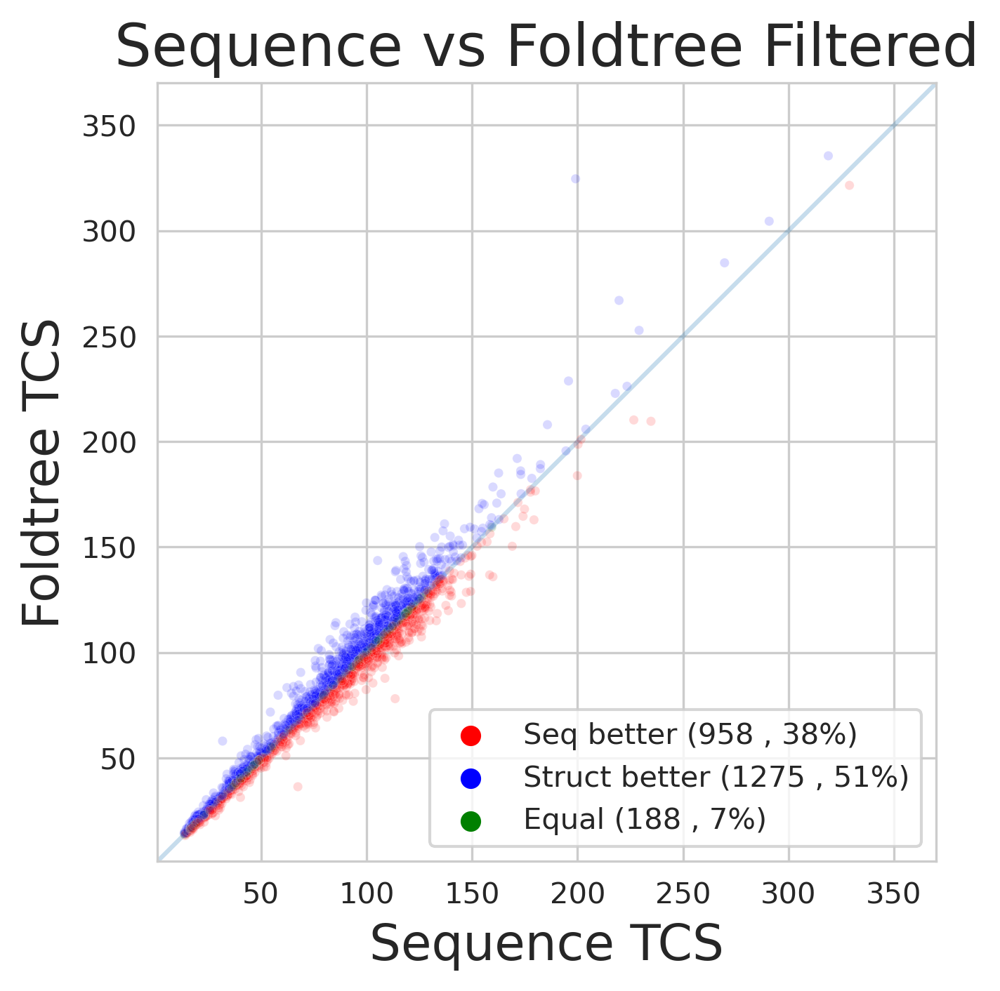

In [18]:
retgraph(  'sequences.aln.clustalo.fst.nwk.rooted_norm' , 'fident_1_raw_struct_tree_norm' , filtereddf 
         ,'Sequence TCS' ,  'Foldtree TCS',  'Sequence vs Foldtree Filtered')

[<matplotlib.collections.PathCollection object at 0x7f1408241ae0>, <matplotlib.collections.PathCollection object at 0x7f14082425f0>, <matplotlib.collections.PathCollection object at 0x7f1408231e10>] ['Seq better', 'Struct better', 'Equal']


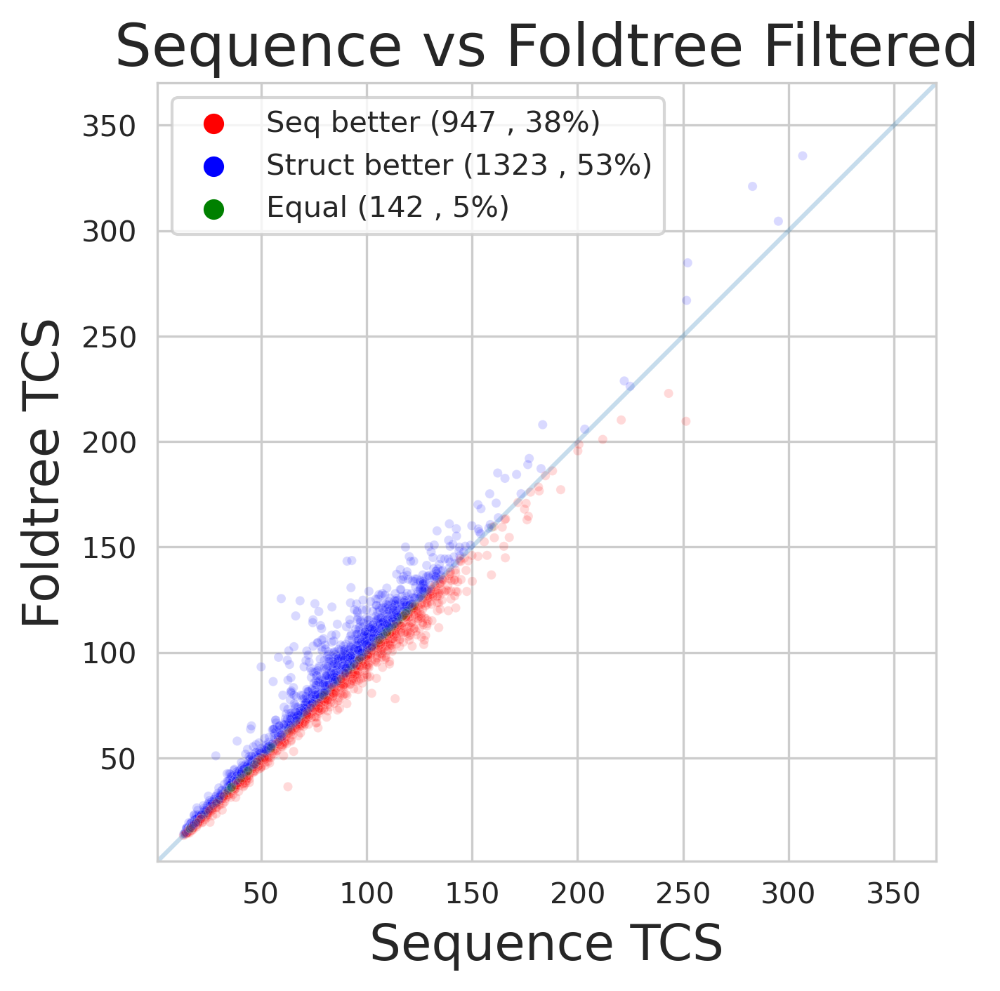

In [19]:
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'fident_1_raw_struct_tree_norm' , filtereddf 
         ,'Sequence TCS' ,  'Foldtree TCS',  'Sequence vs Foldtree Filtered')

[<matplotlib.collections.PathCollection object at 0x7f1408202230>, <matplotlib.collections.PathCollection object at 0x7f14083f6770>, <matplotlib.collections.PathCollection object at 0x7f14083f5960>] ['Equal', 'Struct better', 'Seq better']


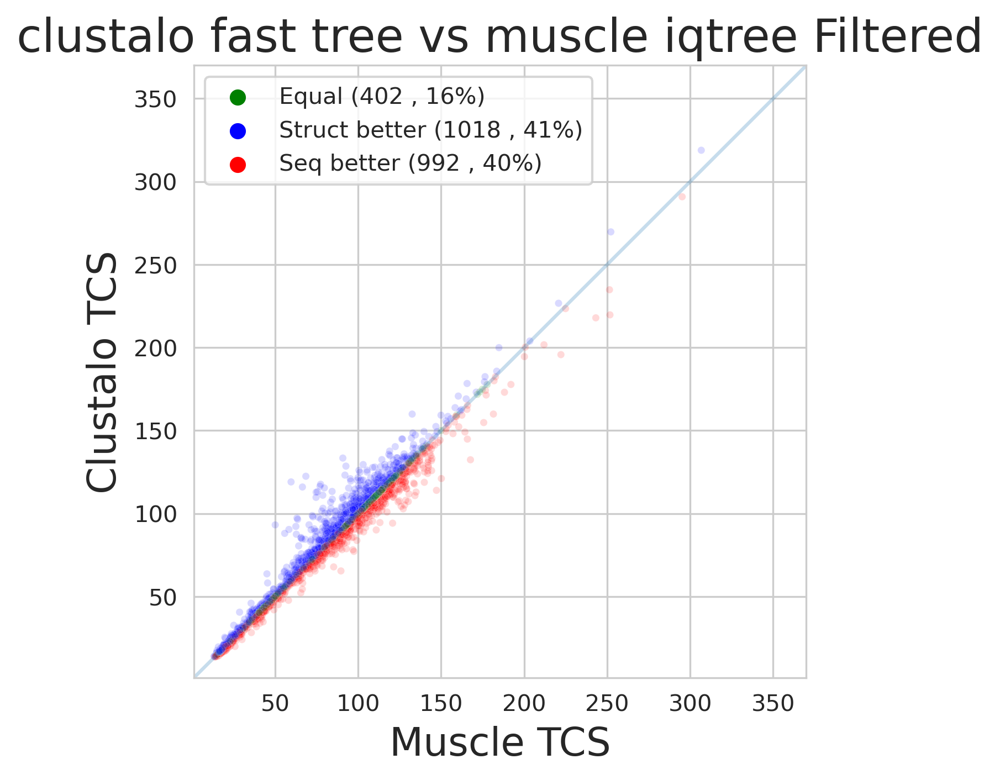

In [20]:
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'sequences.aln.clustalo.fst.nwk.rooted_norm' , filtereddf 
         ,'Muscle TCS' ,  'Clustalo TCS',  'clustalo fast tree vs muscle iqtree Filtered')

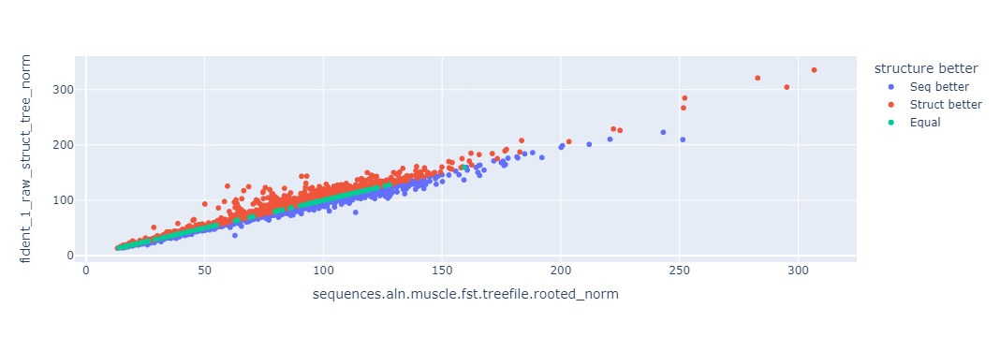

In [21]:
retgraph_plotly(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'fident_1_raw_struct_tree_norm' ,  filtereddf
         ,'Sequence TCS' ,  'Foldtree TCS',  '')


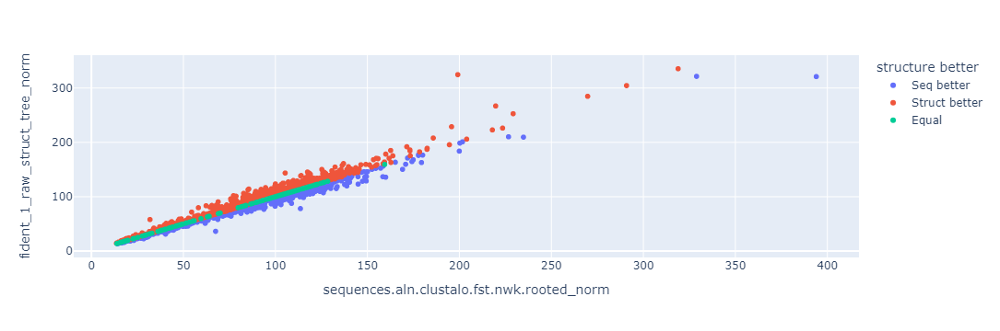

In [22]:
retgraph_plotly(  'sequences.aln.clustalo.fst.nwk.rooted_norm' , 'fident_1_raw_struct_tree_norm' ,  filtereddf
         ,'Sequence TCS' ,  'Foldtree TCS',  '')



[<matplotlib.collections.PathCollection object at 0x7f13f7188970>, <matplotlib.collections.PathCollection object at 0x7f13f7188dc0>, <matplotlib.collections.PathCollection object at 0x7f13f7189210>] ['Seq better', 'Struct better', 'Equal']


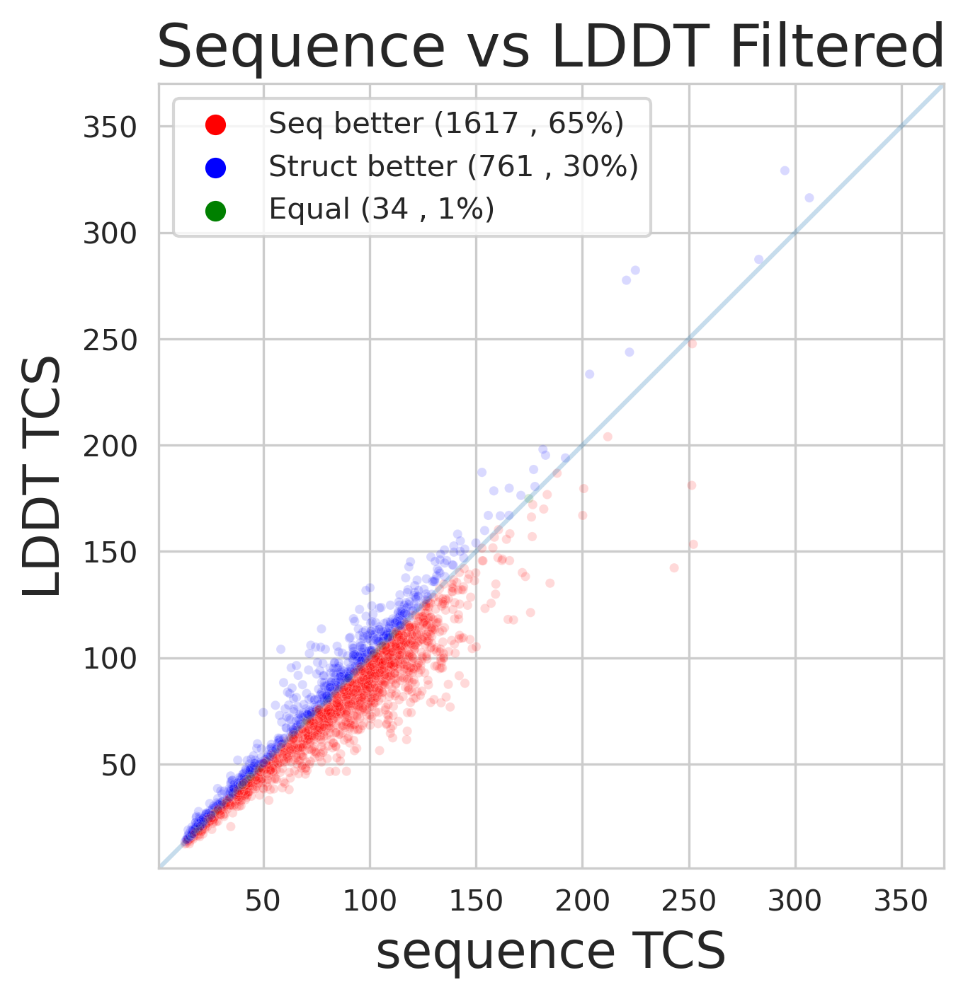

In [23]:

retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'lddt_1_raw_struct_tree_norm' , filtereddf 
         ,'sequence TCS' ,  'LDDT TCS',  'Sequence vs LDDT Filtered')

[<matplotlib.collections.PathCollection object at 0x7f13fd06d150>, <matplotlib.collections.PathCollection object at 0x7f13fd06fb50>, <matplotlib.collections.PathCollection object at 0x7f13fd06ffa0>] ['Seq better', 'Struct better', 'Equal']


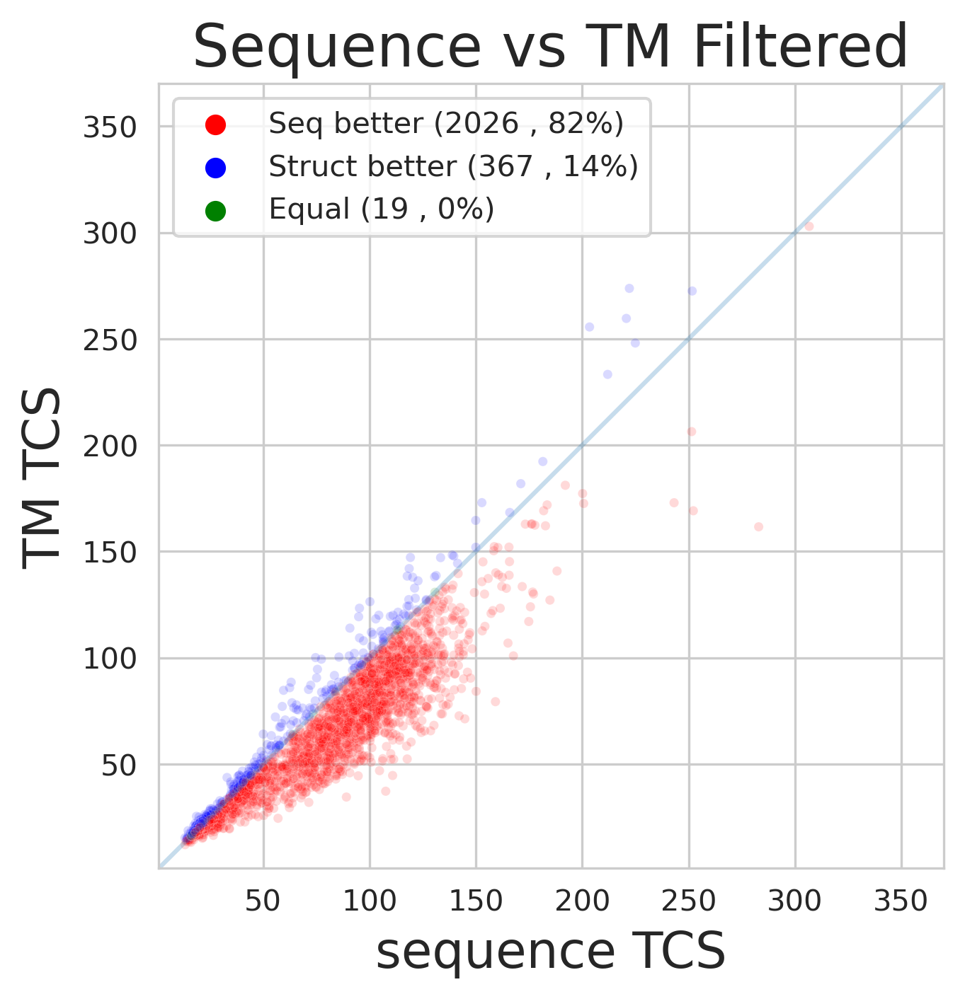

In [24]:

retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'alntmscore_1_raw_struct_tree_norm' , filtereddf 
         ,'sequence TCS' ,  'TM TCS',  'Sequence vs TM Filtered')


[<matplotlib.collections.PathCollection object at 0x7f13f71094b0>, <matplotlib.collections.PathCollection object at 0x7f13f7109cc0>, <matplotlib.collections.PathCollection object at 0x7f13f7109930>] ['Struct better', 'Seq better', 'Equal']


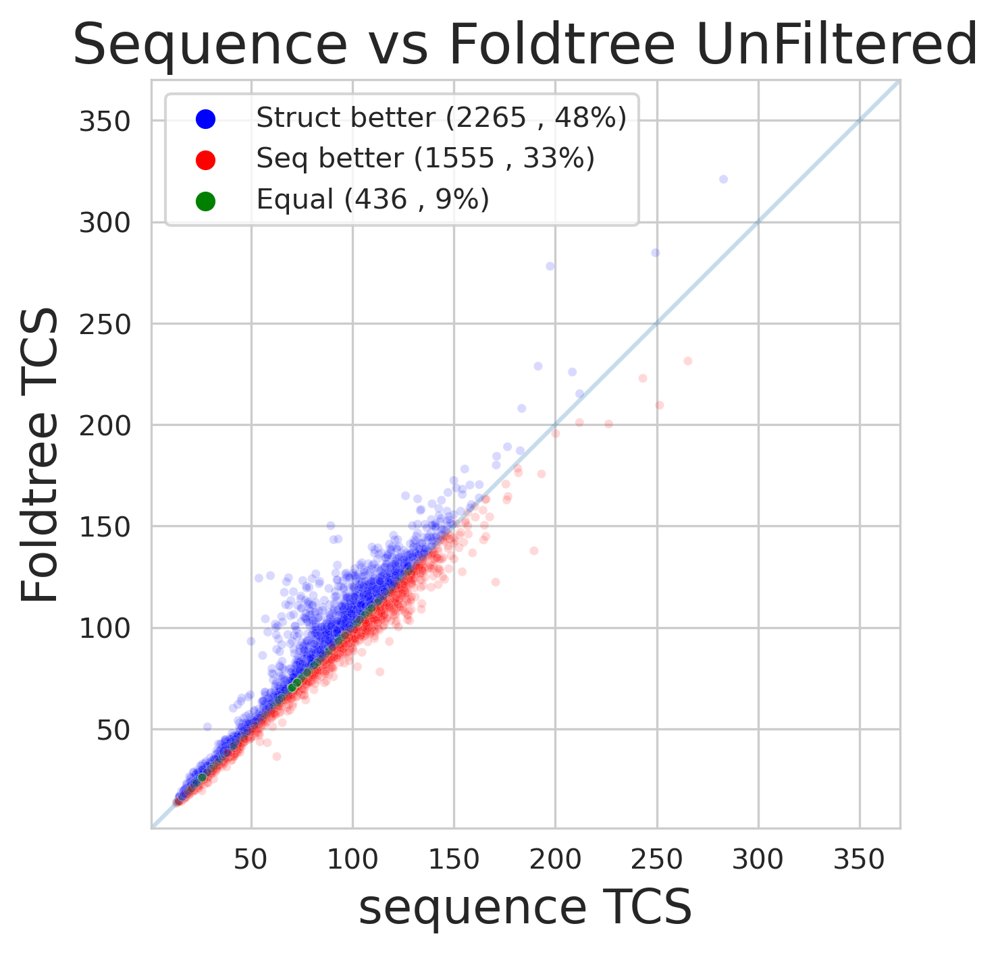

In [25]:
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'fident_1_raw_struct_tree_norm' , unfiltereddf 
         ,'sequence TCS' ,  'Foldtree TCS',  'Sequence vs Foldtree UnFiltered')

[<matplotlib.collections.PathCollection object at 0x7f1403f01ab0>, <matplotlib.collections.PathCollection object at 0x7f1403f03fd0>, <matplotlib.collections.PathCollection object at 0x7f1403f00c70>] ['Struct better', 'Seq better', 'Equal']


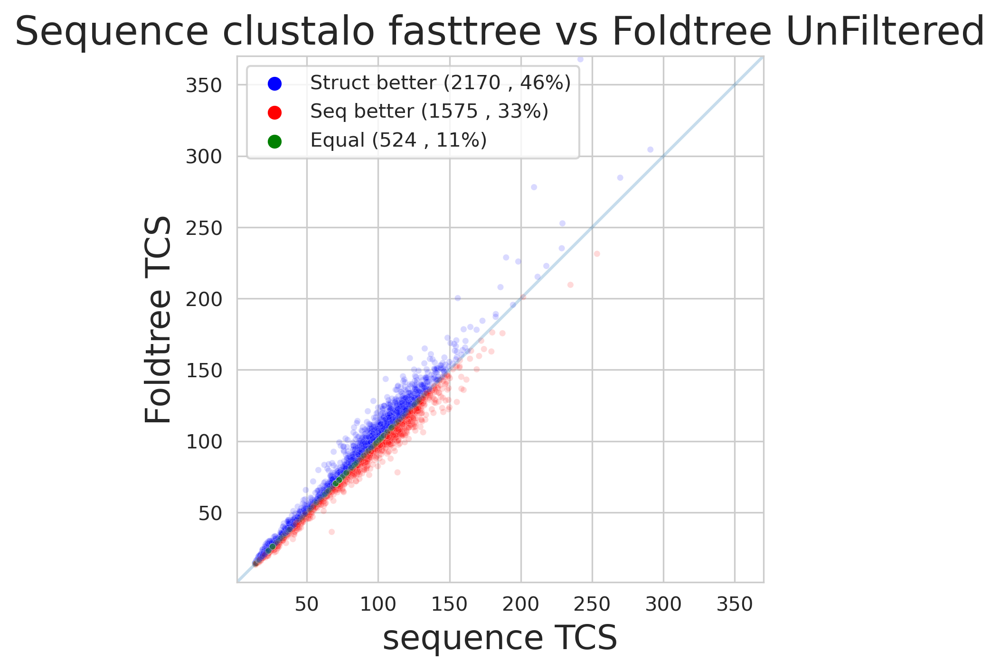

In [26]:
retgraph(  'sequences.aln.clustalo.fst.nwk.rooted_norm' , 'fident_1_raw_struct_tree_norm' , unfiltereddf 
         ,'sequence TCS' ,  'Foldtree TCS',  'Sequence clustalo fasttree vs Foldtree UnFiltered')

[<matplotlib.collections.PathCollection object at 0x7f13ff23b5e0>, <matplotlib.collections.PathCollection object at 0x7f13ff238580>, <matplotlib.collections.PathCollection object at 0x7f13ff23a8c0>] ['Seq better', 'Equal', 'Struct better']


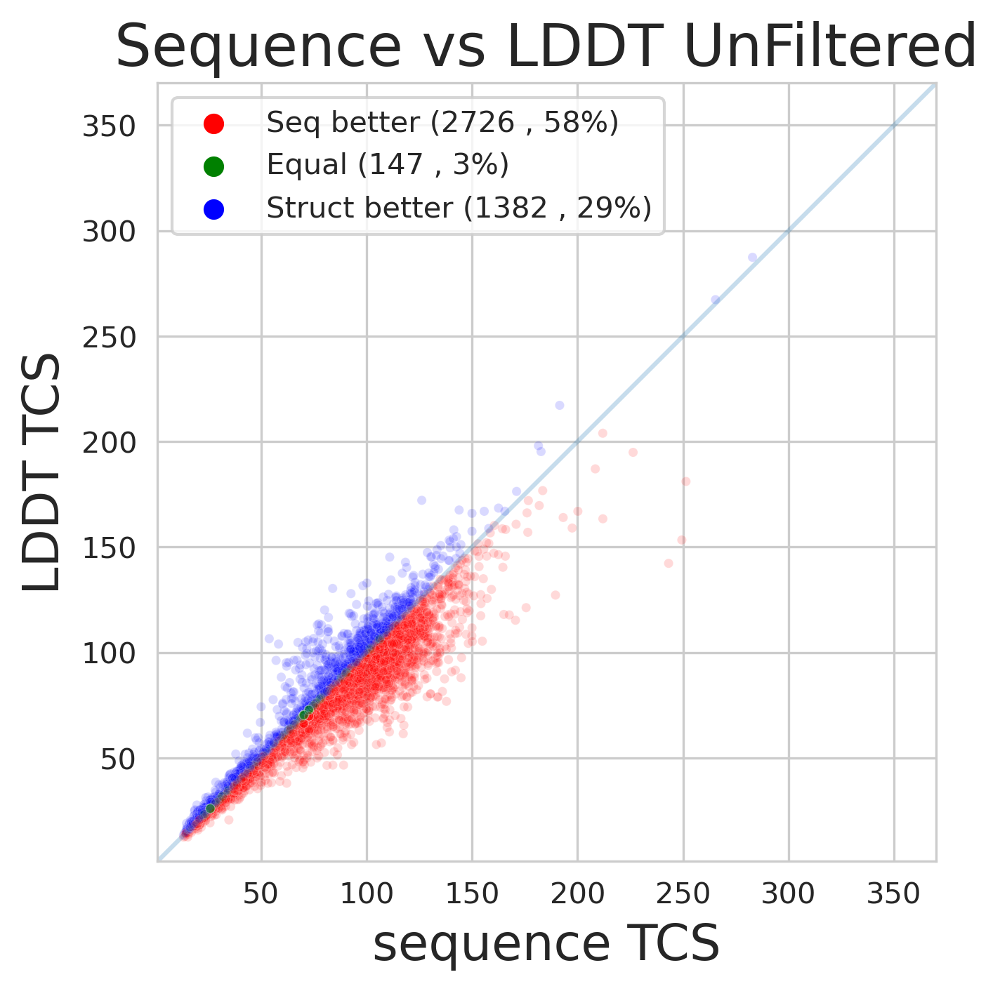

In [27]:
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'lddt_1_raw_struct_tree_norm' , unfiltereddf 
         ,'sequence TCS' ,  'LDDT TCS',  'Sequence vs LDDT UnFiltered')

[<matplotlib.collections.PathCollection object at 0x7f1408200250>, <matplotlib.collections.PathCollection object at 0x7f1408f97040>, <matplotlib.collections.PathCollection object at 0x7f1408f96dd0>] ['Seq better', 'Struct better', 'Equal']


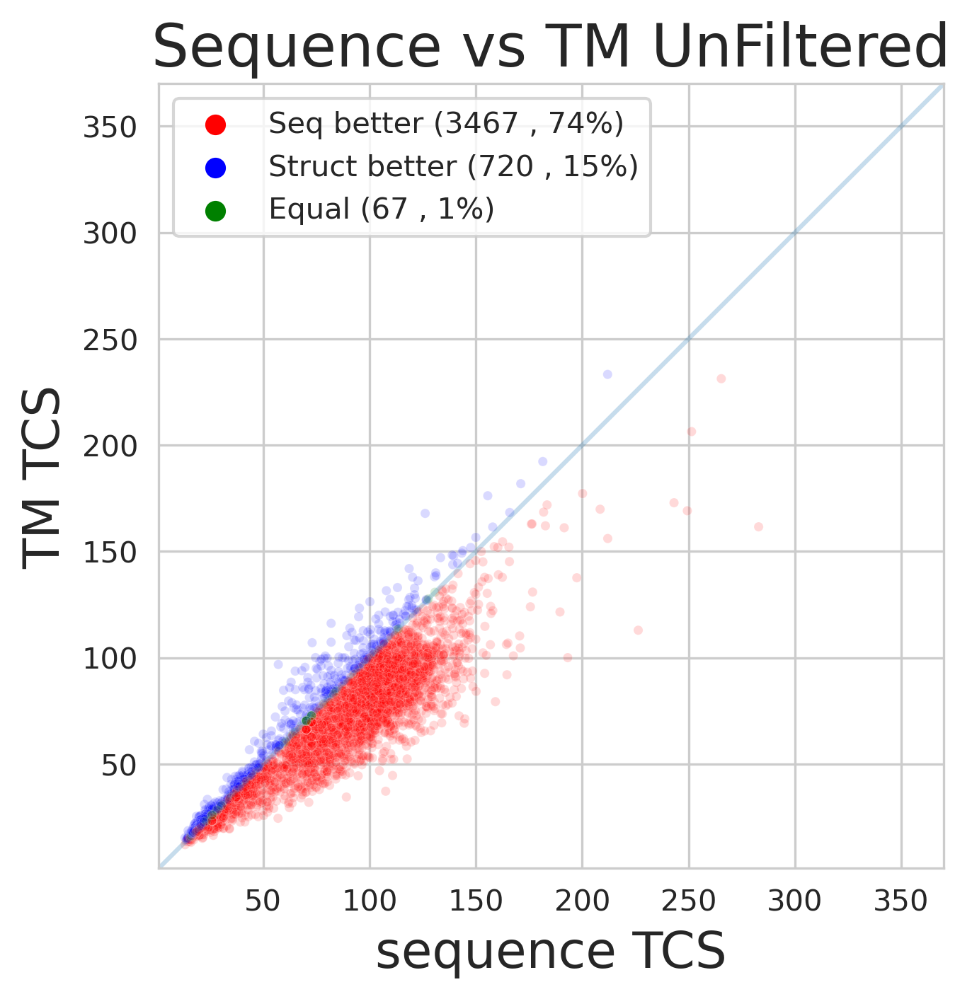

In [28]:
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'alntmscore_1_raw_struct_tree_norm' , unfiltereddf 
         ,'sequence TCS' ,  'TM TCS',  'Sequence vs TM UnFiltered')

[<matplotlib.collections.PathCollection object at 0x7f13f718b9a0>, <matplotlib.collections.PathCollection object at 0x7f13f71e1cc0>, <matplotlib.collections.PathCollection object at 0x7f14081e3e20>] ['Seq better', 'Struct better', 'Equal']


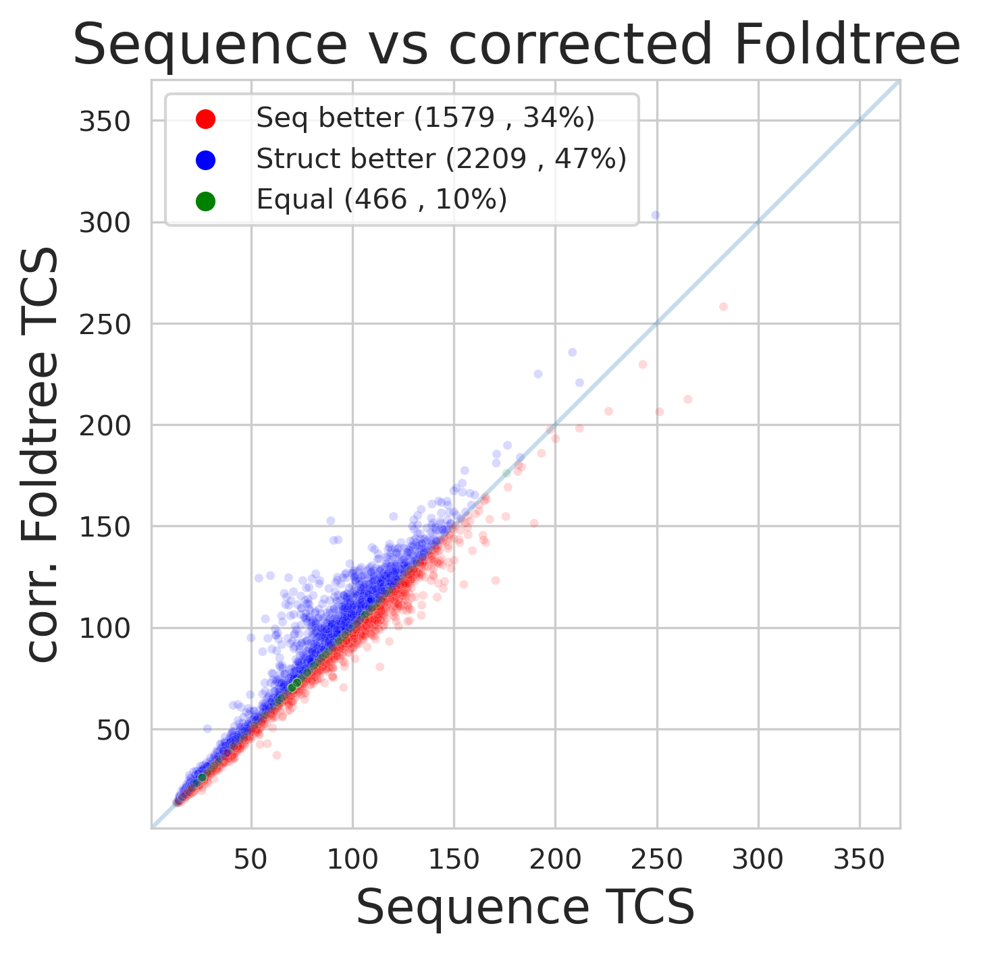

[<matplotlib.collections.PathCollection object at 0x7f13ff2a3610>, <matplotlib.collections.PathCollection object at 0x7f13ff2a1240>, <matplotlib.collections.PathCollection object at 0x7f13ff2a20e0>] ['Seq better', 'Struct better', 'Equal']


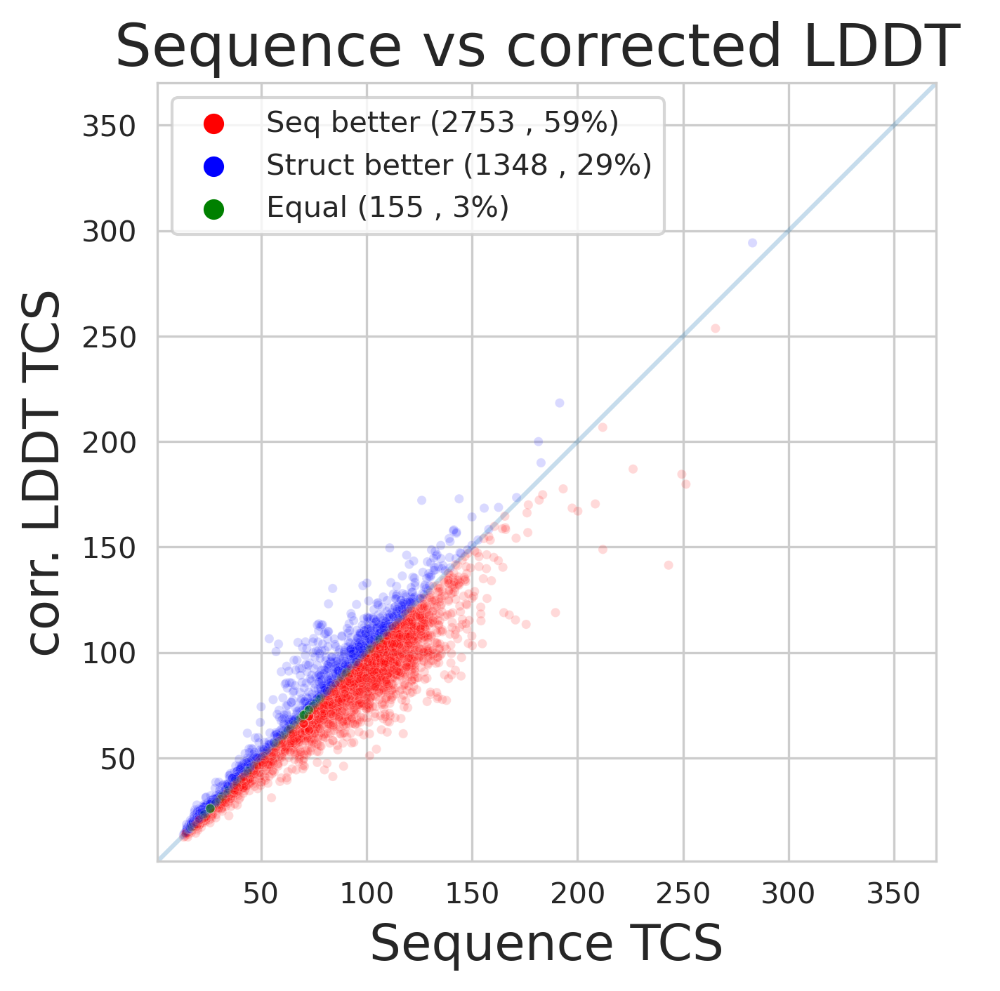

[<matplotlib.collections.PathCollection object at 0x7f13fe934f70>, <matplotlib.collections.PathCollection object at 0x7f13fe935ba0>, <matplotlib.collections.PathCollection object at 0x7f13fe935ed0>] ['Seq better', 'Struct better', 'Equal']


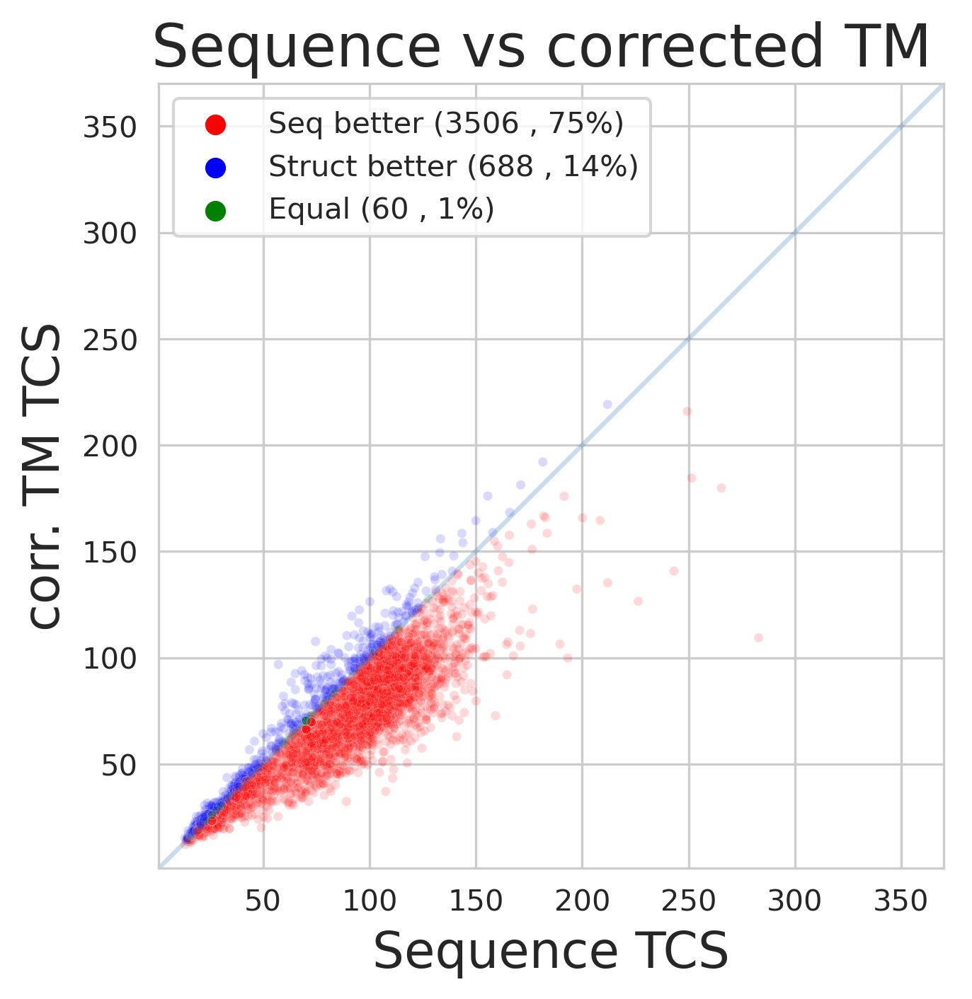

In [29]:
#species tree discordance for cat dataset
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'fident_1_exp_struct_tree_norm' ,  unfiltereddf
         ,'Sequence TCS' ,  'corr. Foldtree TCS',  'Sequence vs corrected Foldtree ')
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'lddt_1_exp_struct_tree_norm' ,  unfiltereddf
         ,'Sequence TCS' ,  'corr. LDDT TCS',  'Sequence vs corrected LDDT ')
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'alntmscore_1_exp_struct_tree_norm' ,  unfiltereddf
         ,'Sequence TCS' ,  'corr. TM TCS',  'Sequence vs corrected TM ')

[<matplotlib.collections.PathCollection object at 0x7f13fd02b1f0>, <matplotlib.collections.PathCollection object at 0x7f13fd028730>, <matplotlib.collections.PathCollection object at 0x7f13f651c730>] ['Seq better', 'Struct better', 'Equal']


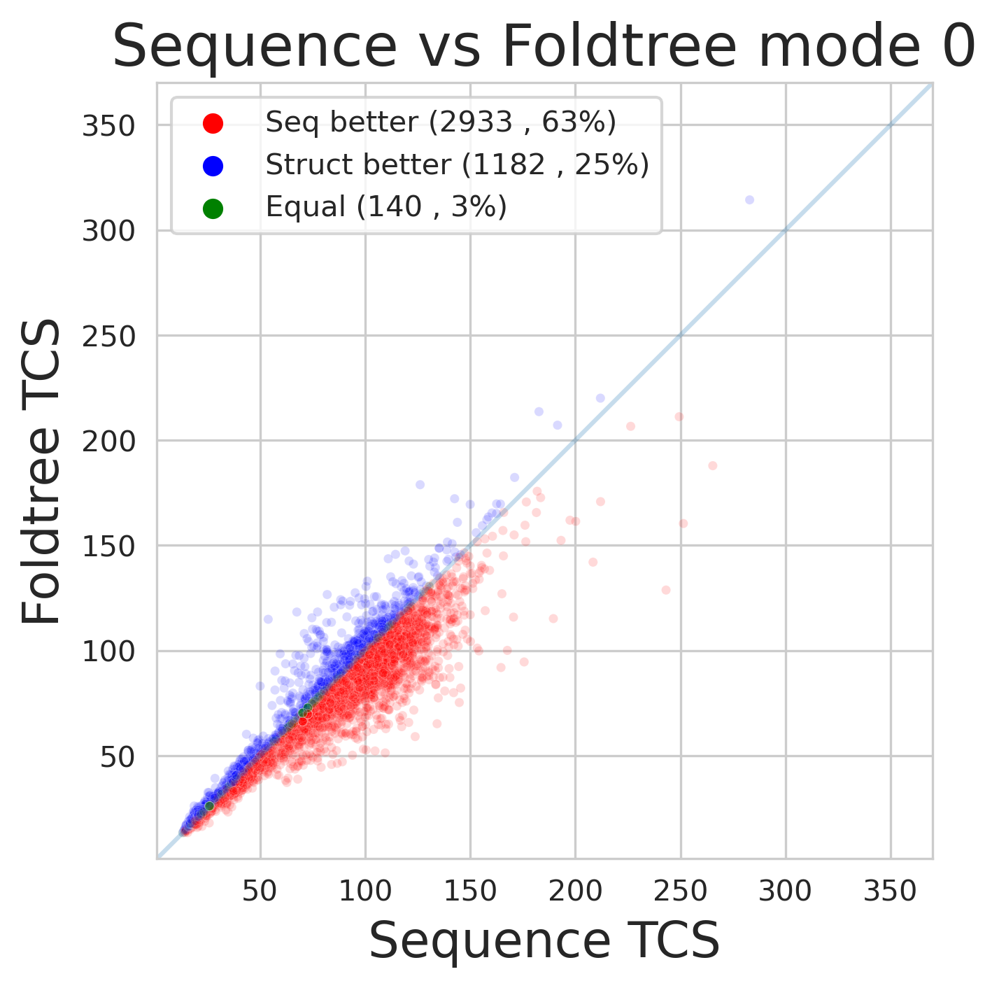

[<matplotlib.collections.PathCollection object at 0x7f13f65c61a0>, <matplotlib.collections.PathCollection object at 0x7f13fd02be50>, <matplotlib.collections.PathCollection object at 0x7f13fd0cdfc0>] ['Seq better', 'Struct better', 'Equal']


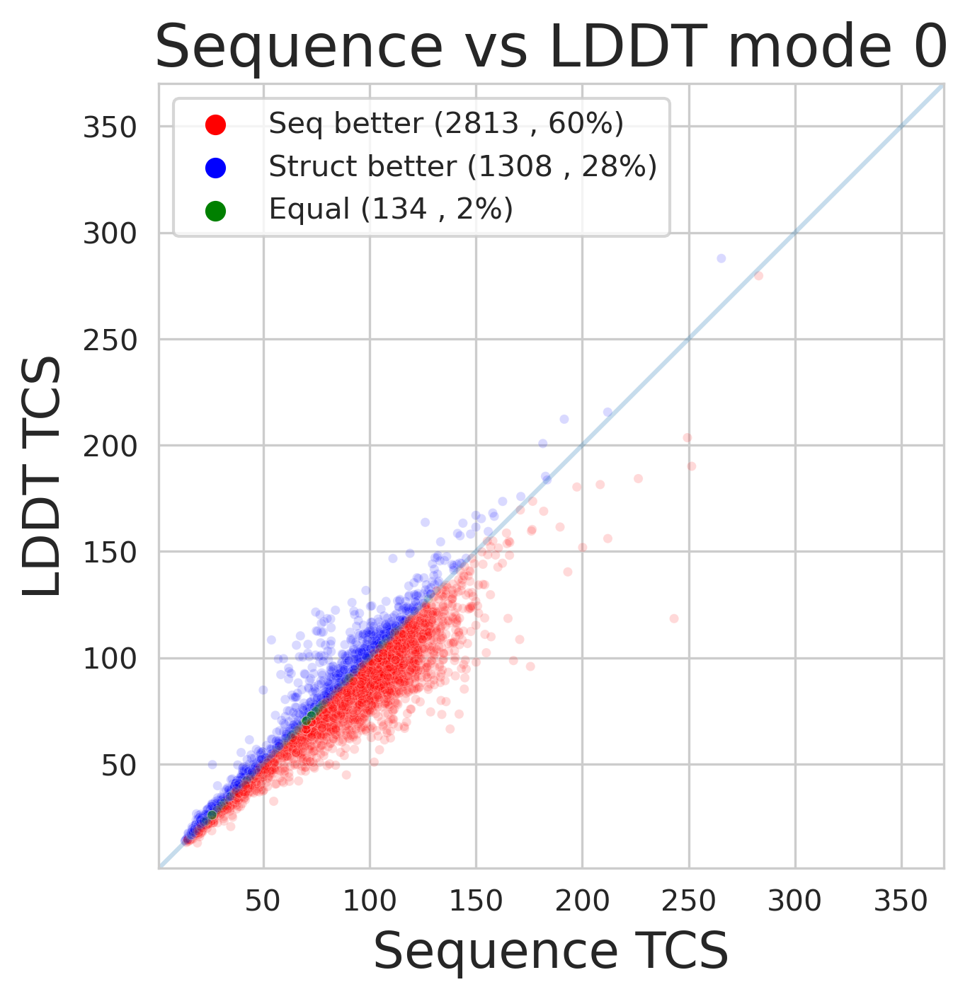

[<matplotlib.collections.PathCollection object at 0x7f13f5185630>, <matplotlib.collections.PathCollection object at 0x7f13f5184070>, <matplotlib.collections.PathCollection object at 0x7f13f51868f0>] ['Struct better', 'Seq better', 'Equal']


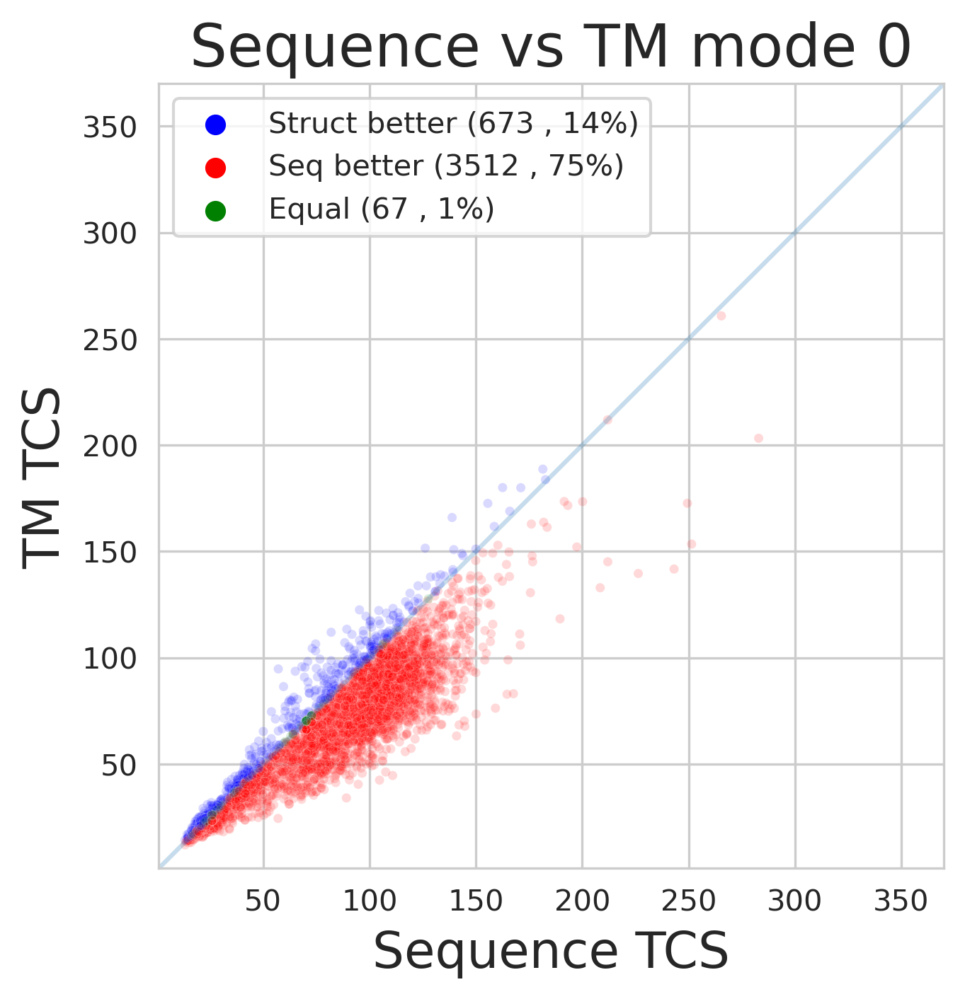

In [30]:
#species tree discordance for cat dataset
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'fident_0_raw_struct_tree_norm' ,  unfiltereddf
         ,'Sequence TCS' ,  'Foldtree TCS',  'Sequence vs Foldtree mode 0')
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'lddt_0_raw_struct_tree_norm' ,  unfiltereddf
         ,'Sequence TCS' ,  'LDDT TCS',  'Sequence vs LDDT mode 0')
retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'alntmscore_0_raw_struct_tree_norm' ,  unfiltereddf
         ,'Sequence TCS' ,  'TM TCS',  'Sequence vs TM mode 0')

['Opisthokonta' 'LUCA' 'Bilateria' 'Eukaryota' 'Euteleostomi' 'Eumetazoa'
 'Tetrapoda' 'Bacteria' 'Chordata' 'Dikarya' 'Fungi']
[<matplotlib.collections.PathCollection object at 0x7f13f51299c0>, <matplotlib.collections.PathCollection object at 0x7f13f5129e10>, <matplotlib.collections.PathCollection object at 0x7f13f512a260>] ['Struct better', 'Seq better', 'Equal']


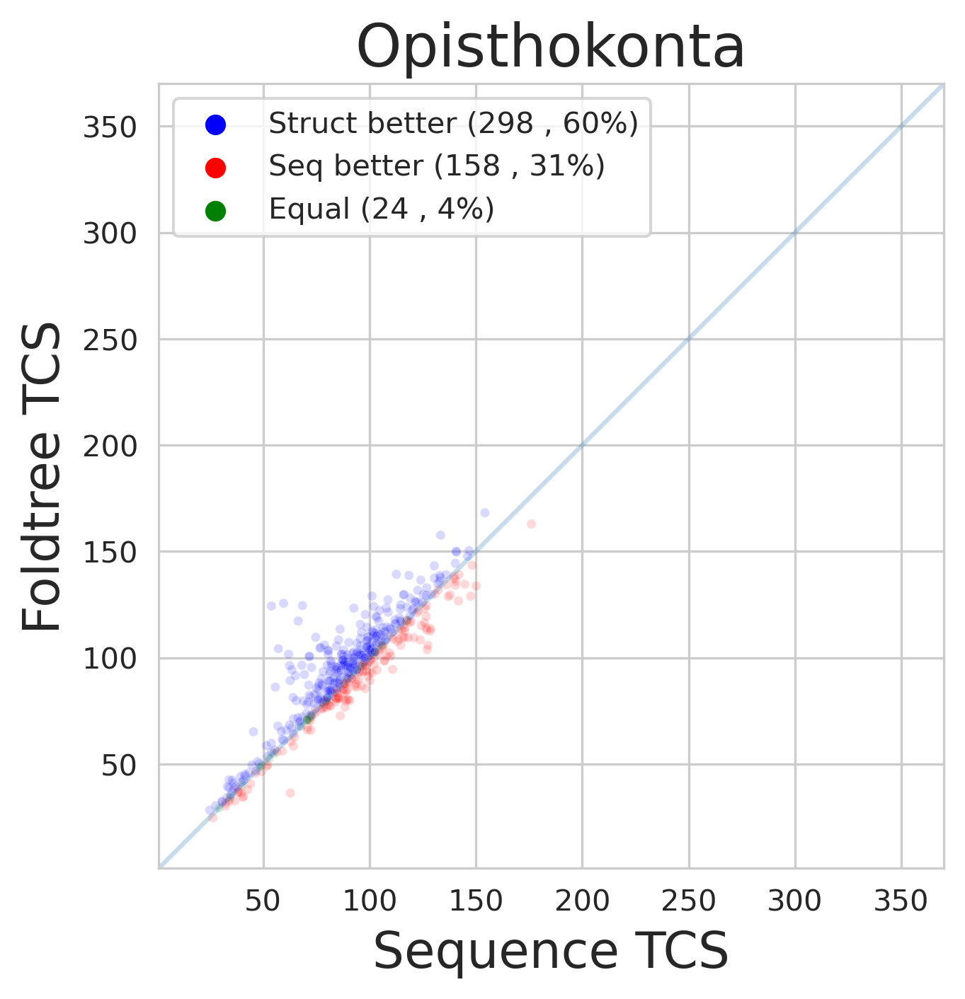

[<matplotlib.collections.PathCollection object at 0x7f13f50c04f0>, <matplotlib.collections.PathCollection object at 0x7f13f50c0940>, <matplotlib.collections.PathCollection object at 0x7f13f50c0d90>] ['Struct better', 'Seq better', 'Equal']


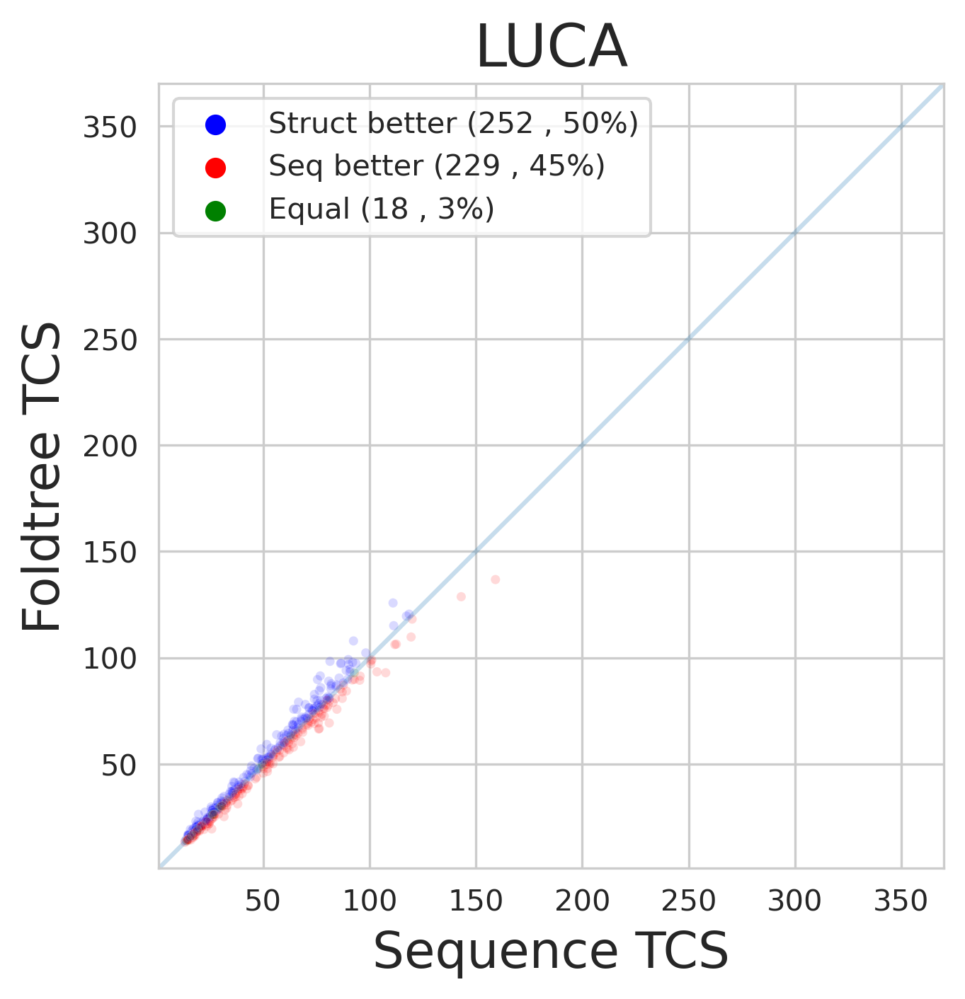

[<matplotlib.collections.PathCollection object at 0x7f13fe7eb730>, <matplotlib.collections.PathCollection object at 0x7f13f50c0d30>, <matplotlib.collections.PathCollection object at 0x7f13fe7eada0>] ['Struct better', 'Equal', 'Seq better']


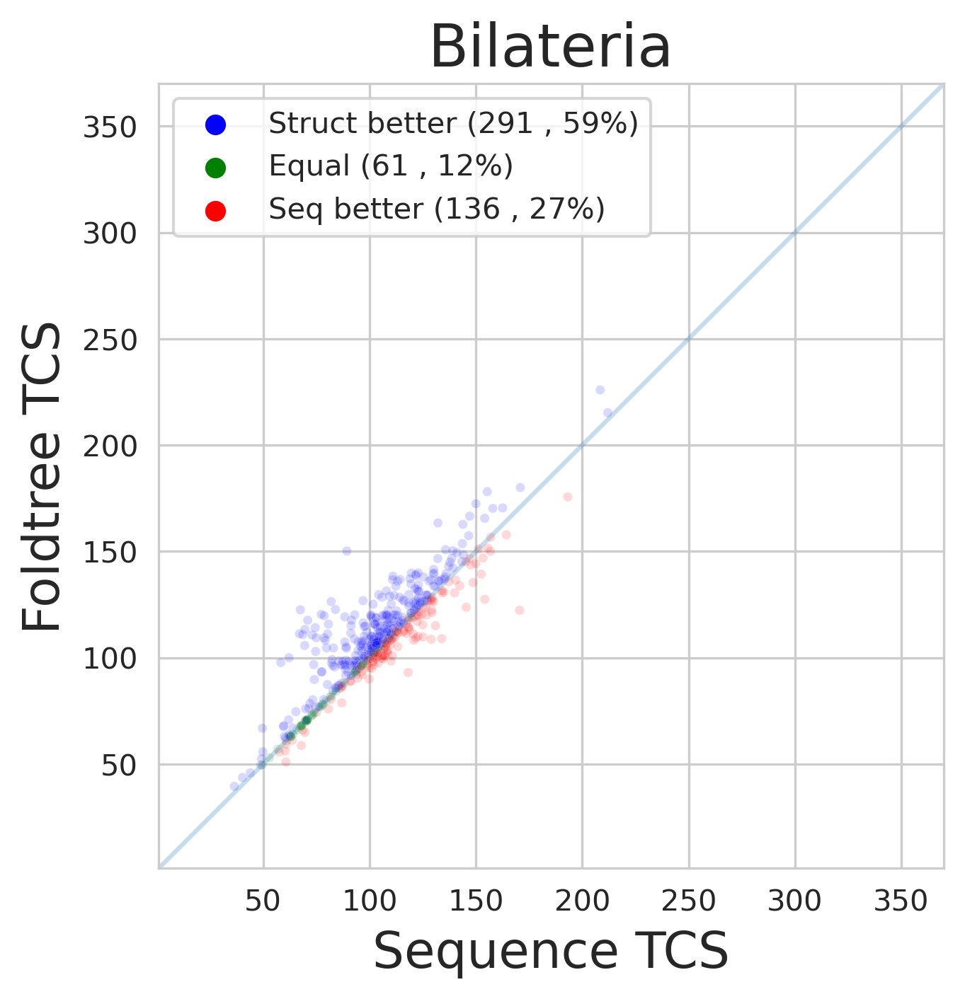

[<matplotlib.collections.PathCollection object at 0x7f13fe86e3b0>, <matplotlib.collections.PathCollection object at 0x7f13fe86e800>, <matplotlib.collections.PathCollection object at 0x7f13fe897880>] ['Seq better', 'Struct better', 'Equal']


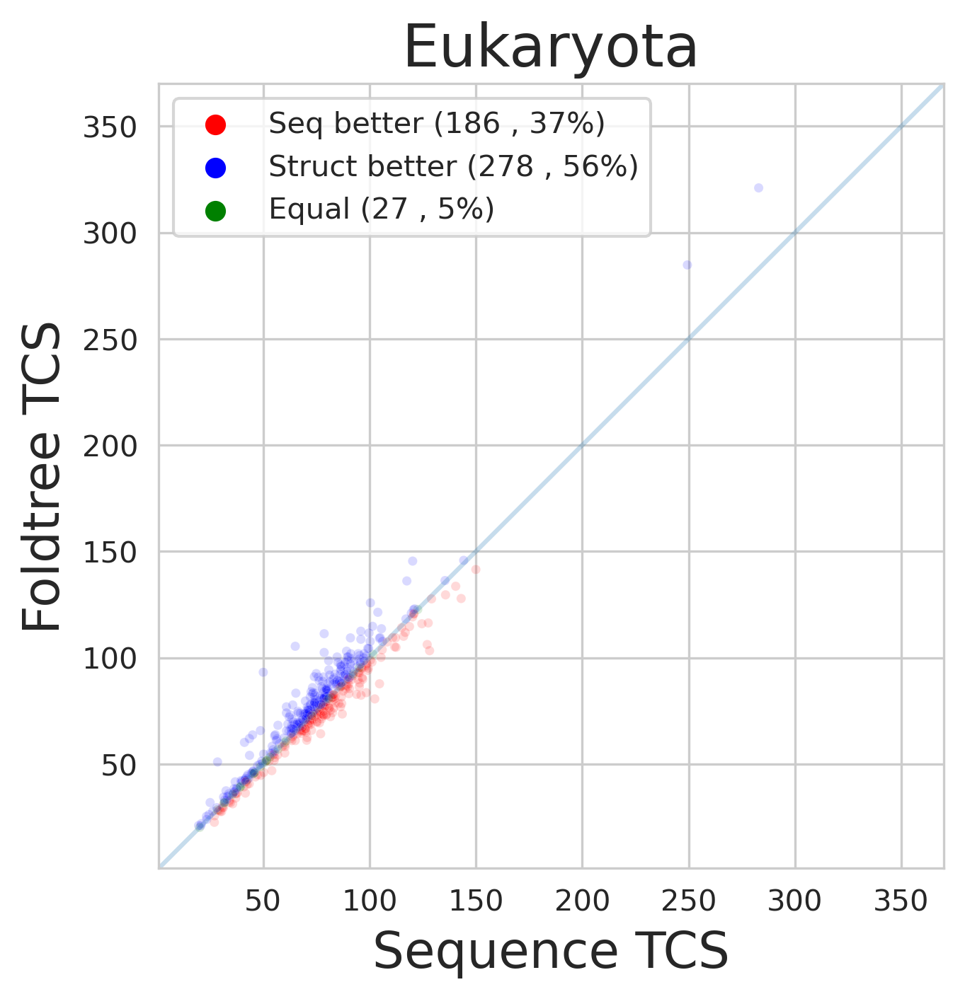

[<matplotlib.collections.PathCollection object at 0x7f13f5201000>, <matplotlib.collections.PathCollection object at 0x7f13f5201450>, <matplotlib.collections.PathCollection object at 0x7f13f52018a0>] ['Struct better', 'Seq better', 'Equal']


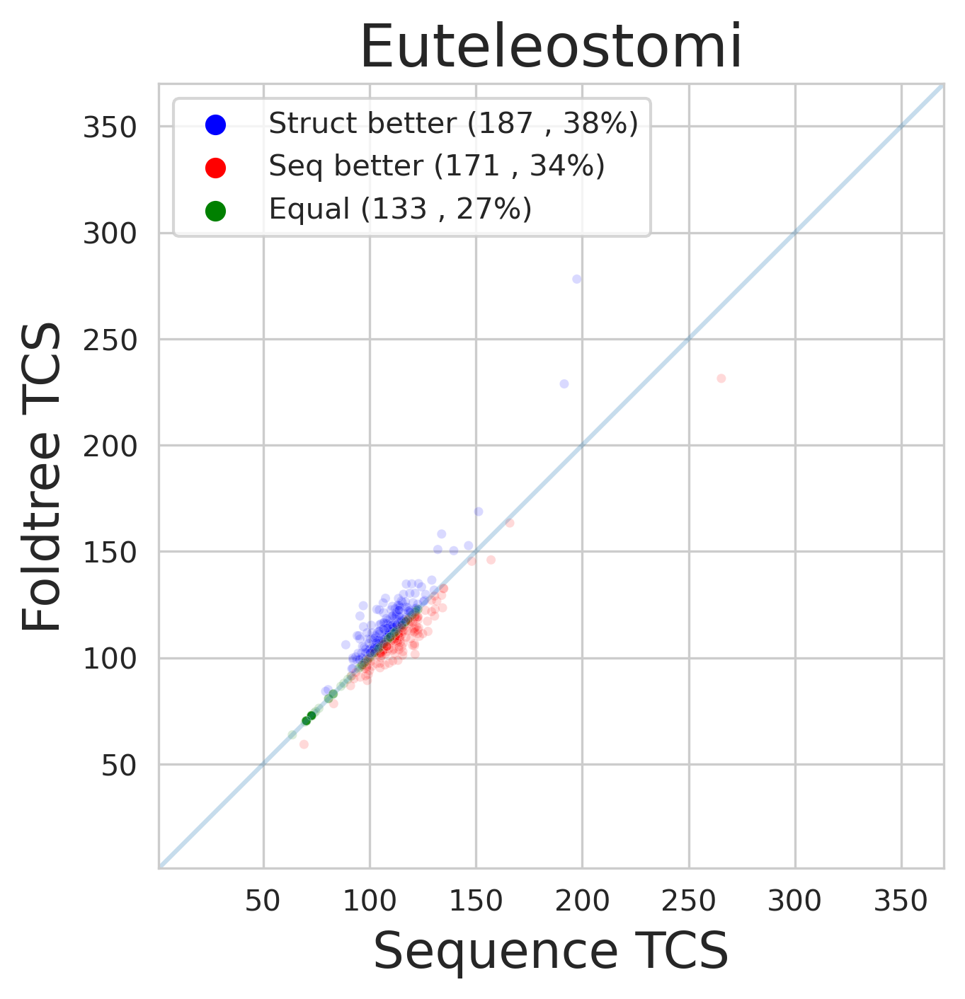

[<matplotlib.collections.PathCollection object at 0x7f13fe5dcdf0>, <matplotlib.collections.PathCollection object at 0x7f13f525fca0>, <matplotlib.collections.PathCollection object at 0x7f13f525e0e0>] ['Seq better', 'Struct better', 'Equal']


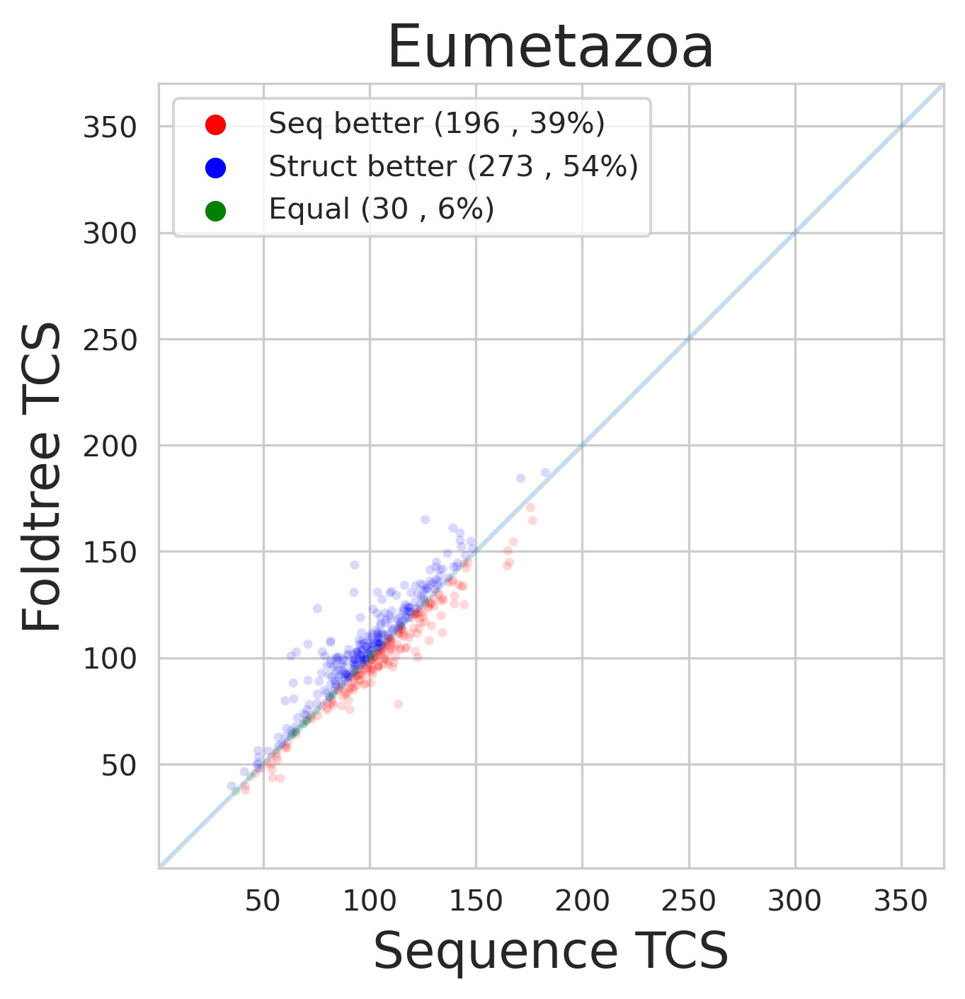

/tmp/34142893/ipykernel_2003500/116354154.py:20: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[] []


<Figure size 1920x1440 with 1 Axes>

[<matplotlib.collections.PathCollection object at 0x7f13f5186110>, <matplotlib.collections.PathCollection object at 0x7f13f5187df0>, <matplotlib.collections.PathCollection object at 0x7f13f5186920>] ['Seq better', 'Struct better', 'Equal']


<Figure size 1920x1440 with 1 Axes>

[<matplotlib.collections.PathCollection object at 0x7f13ff2653f0>, <matplotlib.collections.PathCollection object at 0x7f13ff282bf0>, <matplotlib.collections.PathCollection object at 0x7f13ff281330>] ['Seq better', 'Struct better', 'Equal']


<Figure size 1920x1440 with 1 Axes>

[<matplotlib.collections.PathCollection object at 0x7f14083ddc60>, <matplotlib.collections.PathCollection object at 0x7f14083dd600>, <matplotlib.collections.PathCollection object at 0x7f1408220a00>] ['Struct better', 'Equal', 'Seq better']


<Figure size 1920x1440 with 1 Axes>

[<matplotlib.collections.PathCollection object at 0x7f140811aef0>, <matplotlib.collections.PathCollection object at 0x7f1408118fa0>, <matplotlib.collections.PathCollection object at 0x7f140811a3b0>] ['Seq better', 'Equal', 'Struct better']


<Figure size 1920x1440 with 1 Axes>

In [31]:
unfiltereddf['level'] = unfiltereddf.index.map( lambda x: x.split('/')[3])
print(unfiltereddf['level'].unique() )
for l in unfiltereddf['level'].unique():
    sub = unfiltereddf[unfiltereddf.level == l ]
    #species tree discordance for cat dataset
    retgraph(  'sequences.aln.muscle.fst.treefile.rooted_norm' , 'fident_1_raw_struct_tree_norm' ,  sub
         ,'Sequence TCS' ,  'Foldtree TCS',  l)

In [32]:
#characterise the ultrametricity of the tree
#todo iterate over hogs and cath and train a model
from compile_treeset import compile_folder_treestats
import pandas as pd
cladefolders = set(glob.glob( '../OMA_data/*/' ))-set([ '../OMA_data/logs/' ])
cladefolders = set(glob.glob( '../OMA_data_unfiltered/OMA_data/*/' ))-set([ '../OMA_data/logs/' ])

cladefolders = cladefolders.union( set(glob.glob( '../OMA_data_unfiltered/OMA_data/*/' )) - set([ '../OMA_data_unfiltered/OMA_data/logs/' ]) )
dfs = []
for folder in cladefolders:
    print(folder)
    OMA_treestat_DF = compile_folder_treestats( folder, verbose = False  )
    dfs.append(OMA_treestat_DF)
OMA_treestats = pd.concat(dfs)

print(OMA_treestats)

../OMA_data_unfiltered/OMA_data/Eumetazoa/
../OMA_data_unfiltered/OMA_data/Eumetazoa/
500


processed: 500: 100%|█████████▉| 499/500 [00:28<00:00, 17.33it/s]


../OMA_data_unfiltered/OMA_data/Chordata/
../OMA_data_unfiltered/OMA_data/Chordata/
500


processed: 500:  99%|█████████▉| 494/500 [00:05<00:00, 90.62it/s] 


../OMA_data_unfiltered/OMA_data/Fungi/
../OMA_data_unfiltered/OMA_data/Fungi/
138


processed: 138:  99%|█████████▉| 137/138 [00:00<00:00, 167.28it/s]


../OMA_data_unfiltered/OMA_data/Euteleostomi/
../OMA_data_unfiltered/OMA_data/Euteleostomi/
500


processed: 500:  98%|█████████▊| 491/500 [00:02<00:00, 165.09it/s]


../OMA_data_unfiltered/OMA_data/Dikarya/
../OMA_data_unfiltered/OMA_data/Dikarya/
186


processed: 186:  99%|█████████▉| 184/186 [00:00<00:00, 256.11it/s]


../OMA_data_unfiltered/OMA_data/Bilateria/
../OMA_data_unfiltered/OMA_data/Bilateria/
500


processed: 500:  98%|█████████▊| 489/500 [00:59<00:01,  8.22it/s] 


../OMA_data_unfiltered/OMA_data/Opisthokonta/
../OMA_data_unfiltered/OMA_data/Opisthokonta/
500


processed: 42:   8%|▊         | 42/500 [00:10<01:51,  4.10it/s]


KeyboardInterrupt: 

In [ ]:
OMA_treestats.to_pickle('OMA_treestats.pkl')


In [33]:
OMA_treestats = pd.read_pickle('OMA_treestats.pkl')


In [ ]:
cladefolders = [ '../CAT_data/' ,'../CATH_data/' ]
dfs = []
for folder in cladefolders:
    print(folder)
    CATH_treestat_DF = compile_folder_treestats( folder, verbose = False  )
    dfs.append(CATH_treestat_DF)
CATH_treestats = pd.concat(dfs)

In [ ]:
print(CATH_treestats)

In [ ]:
CATH_treestats.to_pickle('CATH_treestats.pkl')

In [34]:
treestats_df = OMA_treestats.dropna()
print(len(treestats_df))

4623


In [35]:
print( treestats_df.columns)

Index(['alntmscore_0_raw_struct_tree', 'alntmscore_0_exp_struct_tree',
       'alntmscore_1_exp_struct_tree', 'fident_0_raw_struct_tree',
       'lddt_0_exp_struct_tree', 'lddt_1_exp_struct_tree',
       'fident_0_exp_struct_tree', 'lddt_1_raw_struct_tree',
       'fident_1_raw_struct_tree', 'fident_1_exp_struct_tree',
       'alntmscore_1_raw_struct_tree', 'lddt_0_raw_struct_tree',
       'sequences.aln.clustalo.fst.nwk.rooted',
       'sequences.aln.muscle.fst.nwk.rooted',
       'sequences.aln.fst.treefile.rooted',
       'sequences.aln.muscle.fst.treefile.rooted',
       'sequences.aln.clustalo.fst.treefile.rooted', 'sequences', 'nseqs'],
      dtype='object')


In [36]:
metrics = 'nobsint,minmax,mean,variance,skewness,kurtosis'
import matplotlib.pyplot as plt
plt.figure(figsize=(10,3))
cols = []
for c in treestats_df.columns:
    if 'nseqs' not in c and 'var' not in c and '0' not in c: #and 'exp' not in c:
        
        treestats_df[c+'var'] = treestats_df[c].map( lambda x : x[3] )
        
        cols.append(c+'var')
print(cols)
        #plt.hist( treestats_df[c+'var'] , alpha = .25 , label = c, density = True , bins = 20)
#plt.title( 'Variance of normalized Root to Leaf distance')
#plt.legend()
#plt.show()

['alntmscore_1_exp_struct_treevar', 'lddt_1_exp_struct_treevar', 'lddt_1_raw_struct_treevar', 'fident_1_raw_struct_treevar', 'fident_1_exp_struct_treevar', 'alntmscore_1_raw_struct_treevar', 'sequences.aln.clustalo.fst.nwk.rootedvar', 'sequences.aln.muscle.fst.nwk.rootedvar', 'sequences.aln.fst.treefile.rootedvar', 'sequences.aln.muscle.fst.treefile.rootedvar', 'sequences.aln.clustalo.fst.treefile.rootedvar', 'sequencesvar']


<Figure size 3000x900 with 0 Axes>

In [37]:

cols = ['lddt_1_raw_struct_treevar', 'fident_1_raw_struct_treevar', 'alntmscore_1_raw_struct_treevar', 'sequences.aln.muscle.fst.treefile.rootedvar']
fig, axs = plt.subplots(len(cols), 1, sharex=True,sharey=True, tight_layout=True)
df = treestats_df[cols]
bins=np.histogram(df, bins=1000)[1] #get the bin edges
for i,col in enumerate(cols):
    data = df[col] 
    #data[data>.25]= .25
    axs[i].set_box_aspect(.25)
    
    axs[i].set_xlim(0,.20)
    axs[i].hist( df[col] , bins=bins)
    axs[i].axvline(x = np.median(df[col]), color = 'r', label = str(np.median(df[col])))
    axs[i].grid(False)
    
    axs[i].set_title(col)
    if i == len(cols)-1:
        axs[i].set_xlabel('RTT variance')
    #axs[i].set_ylabel('n Trees')

plt.savefig('../figures/ultrametricity_hist_all.svg')
plt.show()


<Figure size 1920x1440 with 4 Axes>

In [38]:

cols = ['fident_1_exp_struct_treevar' ,'lddt_1_exp_struct_treevar', 'alntmscore_1_exp_struct_treevar', 'sequences.aln.muscle.fst.treefile.rootedvar',
        'fident_1_raw_struct_treevar', 'lddt_1_raw_struct_treevar',  'alntmscore_1_raw_struct_treevar']
fig, axs = plt.subplots(4, 2, sharex=True,sharey=True, tight_layout=True)
df = treestats_df[cols]
bins=np.histogram(df, bins=1000)[1] #get the bin edges

for i,col in enumerate(cols):
    k = int(i/4)
    j = i%4
    print(j,k)
    data = df[col] 
    #data[data>.25]= .25
    axs[j,k].set_box_aspect(.25)
    
    axs[j,k].set_xlim(0,.20)
    axs[j,k].hist( df[col] , bins=bins)
    axs[j,k].axvline(x = np.median(df[col]), color = 'r', label = str(np.median(df[col])))
    axs[j,k].grid(False)
    
    axs[j,k].set_title(col)
    if i == len(cols)-1:
        axs[j,k].set_xlabel('RTT variance')
    #axs[i].set_ylabel('n Trees')

plt.savefig('../figures/ultrametricity_hist_all_exp.svg')
plt.show()


0 0
1 0
2 0
3 0
0 1
1 1
2 1


<Figure size 1920x1440 with 8 Axes>

In [39]:
metrics = 'nobsint,minmax,mean,variance,skewness,kurtosis'
import matplotlib.pyplot as plt
plt.figure(figsize=(10,3))

CATH_treestat_DF = CATH_treestat_DF.dropna()

for c in CATH_treestats.columns:
    if 'nseqs' not in c and 'var' not in c and '0' not in c and 'exp' not in c:
        CATH_treestat_DF[c+'var'] = CATH_treestat_DF[c].map( lambda x : x[3] )
        #plt.hist( treestats_df[c+'var'] , alpha = .25 , label = c, density = True , bins = 20)
#plt.title( 'Variance of normalized Root to Leaf distance')
#plt.legend()
#plt.show()
print(CATH_treestat_DF)

cols = ['lddt_1_raw_struct_tree.PP.nwk.rootedvar', 'fident_1_raw_struct_tree.PP.nwk.rootedvar', 'alntmscore_1_raw_struct_tree.PP.nwk.rootedvar', 'sequences.aln.muscle.fst.treefile.rootedvar']


fig, axs = plt.subplots(len(cols), 1, sharex=True,sharey=True, tight_layout=True)
df = CATH_treestat_DF[cols]

bins=np.histogram(df, bins=1000)[1] #get the bin edges
for i,col in enumerate(cols):
    data = df[col] 
    #data[data>.25]= .25
    axs[i].set_box_aspect(.25)
    axs[i].set_xlim(0,.20)
    axs[i].hist( df[col] , bins=bins)
    axs[i].axvline(x = np.median(df[col]), color = 'r', label = str(np.median(df[col])))
    axs[i].grid(False)
    
    axs[i].set_title(col)
    if i == len(cols)-1:
        axs[i].set_xlabel('RTT variance')
    #axs[i].set_ylabel('n Trees')

plt.savefig('../figures/ultrametricity_hist_CATH.svg')
plt.show()



NameError: name 'CATH_treestat_DF' is not defined

<Figure size 3000x900 with 0 Axes>

In [ ]:
import toytree
import toyplot
import numpy as np
import toyplot.svg

#select random fams
sub = treestats_df.sample(20)



for idx,r in sub.iterrows():
    
    nwks = glob.glob(idx+'*.nwk.rooted')
    trees = []
    kept= []
    for nwk in nwks:
        if '1_raw' in nwk or 'sequences' in nwk:
            kept.append(nwk)
            trees.append(toytree.tree(nwk , format = 0))
    mtre0 = toytree.mtree( trees )
    
    for tree in mtre0.treelist:
        for n in tree.treenode.traverse():
            if n.is_leaf():
                n.size = 5
                n.color = 'red'
            else:
                n.size = 0
                n.color = 'black'
        sizes = tree.get_node_values("size", show_root=True, show_tips=True)
        colors = tree.get_node_values("color", show_root=True, show_tips=True)
        
        tree.style.node_sizes = sizes
        
        
    canvas,axes,mark = mtre0.draw( ncols=len(cols) ,tip_labels=False ,edge_style={"stroke-opacity": 1, "stroke-width": .5}  ,  height=100 , node_colors= 'red')
    '''tip_labels_align=True, edge_align_style={
        "stroke": "violet",
        "stroke-width": 0,
        "stroke-dasharray": "2,5"    # size of dash, spacing of dashes
    } )'''
    print(kept)
    #toyplot.svg.render(canvas, '../figures/'+idx.replace('/' , '_').replace('.','')+'treesample.svg')
    
print(kept)

In [ ]:
#plt the OMA clades w and without filtering 
#plot the cat and cath and total oma with and without filtering


In [ ]:
import numpy as np
from scipy.spatial import distance
from scipy.stats import describe
from matplotlib import pyplot as plt
distances = []
percent_gaps = []

def alnstats(aln):
    align = AlignIO.read(aln, "fasta")
    for i,seq1 in enumerate(align):
        for j,seq2 in enumerate(align):
            if i < j:
                str1 = np.array(list(seq1.seq))
                str2 = np.array(list(seq2.seq))            
                percent_ident = len(np.where( (str1 == str2 ) & (str1 != '-' ) & (str2 != '-')  )[0]) / len(str1)
                percent_gap = len(np.where( (str1 == '-' ) | (str2 == '-')  & ( str1 != str2 )  )[0]) / len(str1)
                percent_gaps.append(percent_gap)
                distances.append(percent_ident)
    if verbose == True:
        plt.title('percent id')            
        plt.ylim( 0, len(distances) / 2)
        plt.hist(distances)
        plt.vlines(np.mean(distances) , 0, len(distances) / 2 , 'r')
        plt.show()


        plt.title('percent gap')
        plt.ylim( 0, len(percent_gaps) / 2)
        plt.hist(percent_gaps)
        plt.vlines(np.mean(percent_gaps) , 0, len(percent_gaps) / 2 , 'r')
        plt.show()
    return describe(percent_gap) , describe(percent_ident)



In [27]:
#construct structure and sequence feature dataset
import tqdm
import glob
import os
import pandas as pd
import numpy as np 
from Bio import AlignIO
from scipy.stats import describe
from matplotlib import pyplot as plt


def alnstats(aln, verbose = False):
    percent_gaps = []
    distances = []
    align = AlignIO.read(aln, "fasta")
    for i,seq1 in enumerate(align):
        for j,seq2 in enumerate(align):
            if i < j:
                str1 = np.array(list(seq1.seq))
                str2 = np.array(list(seq2.seq))            
                percent_ident = len(np.where( (str1 == str2 ) & (str1 != '-' ) & (str2 != '-')  )[0]) / len(str1)
                percent_gap = len(np.where( (str1 == '-' ) | (str2 == '-')  & ( str1 != str2 )  )[0]) / len(str1)
                percent_gaps.append(percent_gap)
                distances.append(percent_ident)
    if verbose == True:
        plt.title('percent id')            
        plt.ylim( 0, len(distances) / 2)
        plt.hist(distances)
        plt.vlines(np.mean(distances) , 0, len(distances) / 2 , 'r')
        plt.show()


        plt.title('percent gap')
        plt.ylim( 0, len(percent_gaps) / 2)
        plt.hist(percent_gaps)
        plt.vlines(np.mean(percent_gaps) , 0, len(percent_gaps) / 2 , 'r')
        plt.show()
    desc_dist= describe(distances)
    desc_gaps=describe(percent_gaps)
    return [ desc_dist.nobs , desc_dist.minmax[0] , desc_dist.minmax[1] , desc_dist.mean, desc_dist.variance,desc_dist.skewness, desc_dist.kurtosis ],[desc_gaps.nobs , desc_gaps.minmax[0] , desc_gaps.minmax[1] , desc_gaps.mean, desc_gaps.variance, desc_gaps.skewness, desc_gaps.kurtosis ]

def ret_description(vec , label = ''):
    return { label+'_mean': np.mean(vec) , label+'_max': np.amax(vec) , label+'_min': np.amin(vec) ,label+'_var': np.var(vec) }

#cladefolders = set(glob.glob( '../OMA_data/*/' ))-set([ '../OMA_data/logs/' ])
cladefolders =  set(glob.glob( '../OMA_data_unfiltered/OMA_data/*/' )) - set([ '../OMA_data_unfiltered/OMA_data/logs/' ])
allfolders = cladefolders

dfs = []
print(allfolders)
for clade in allfolders:
    print(clade)
    res = {}
    folders = glob.glob(clade + '*/' )
    for folder in tqdm.tqdm_notebook(folders):
        if 'logs' not in folder:
            
            nstructs = len(glob.glob(folder+'structs/*.pdb'))
            try:
                with open(folder + 'sequences.fst') as fstin:
                    nseqs = fstin.read().count('>')
            except:
                nseqs = 0
            if nstructs == nseqs:
                if os.path.isfile(folder + 'plddt.json' ) and os.path.isfile(folder + 'sequences.aln.fst' ):
                    plddt_df = pd.read_json(folder + 'plddt.json').T
                    
                    if len(plddt_df)>0:
                        
                        plddt_df.columns = 'nobs,minmax,mean,variance,skewness,kurtosis'.split(',')
                        plddt_df['min'] = plddt_df.minmax.map( lambda r: r[0] )
                        plddt_df['max'] = plddt_df.minmax.map( lambda r: r[1] )
                        res[folder] = {}
                        for col in ['nobs', 'min' , 'max' , 'mean' , 'variance' , 'skewness' , 'kurtosis' ]:
                            descriptors = ret_description(plddt_df[col] , label = col)
                            for l in descriptors:
                                res[folder][l] = descriptors[l]
                        #add in some descriptors of the taxonomic spread and sequence set
                        seqdf = pd.read_csv(folder+'sequence_dataset.csv' )
                        res[folder]['nprots'] = len(seqdf)
                        cladesets = [ set(l.split(',')) for l in  seqdf['Taxonomic lineage (Ids)'] ]
                        union_all = cladesets[0]
                        intersection_all = cladesets[0]
                        for c in cladesets:
                            union_all = union_all.union(c)
                            intersection_all.intersection(c)
                        res[folder]['n_clades'] = len(union_all)
                        res[folder]['inter_clades'] = len(intersection_all)
                        res[folder]['inter/nc'] =  res[folder]['inter_clades'] /  res[folder]['n_clades'] 
                        res[folder]['nc/np'] = res[folder]['nprots'] / res[folder]['n_clades']
                        
                        aln = folder + 'sequences.aln.fst'
                        percent_ident, percent_gap = alnstats(aln)
                        for i,col in enumerate(['nobs', 'min' , 'max' , 'mean' , 'variance' , 'skewness' , 'kurtosis' ]):
                            res[folder]['alnID_'+col] = percent_ident[i]
                            res[folder]['alnGAP_'+col] = percent_gap[i]
                        
                        
        
    resdf = pd.DataFrame.from_dict(res, orient = 'index')
    dfs.append(resdf)
seqset_resdf = pd.concat(dfs)

In [ ]:
print(seqset_resdf)
seqset_resdf.to_pickle('structure_and_sequence_qcmetrics.pkl')

In [43]:
import pickle
with open( 'structure_and_sequence_qcmetrics.pkl'  , 'rb' ) as dfin:
    seqset_resdf = pickle.loads( dfin.read() )

In [44]:
#add to the tree comparison data
tree_resdf = unfiltereddf.merge( seqset_resdf , left_index = True, right_index = True, how = 'inner' )

In [ ]:
print(tree_resdf.columns)

In [45]:
tree_resdf = tree_resdf.dropna()

In [47]:
#try to predict the delta using these features w gradient boosted trees
#try to predict the RF distance as well

import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, ensemble
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split


In [48]:
#'nc/np'

feature_names = ['nobs_mean', 'nobs_max',
       'nobs_min', 'nobs_var', 'min_mean', 'min_max', 'min_min', 'min_var',
       'max_mean', 'max_max', 'max_min', 'max_var', 'mean_mean', 'mean_max',
       'mean_min', 'mean_var', 'variance_mean', 'variance_max', 'variance_min',
       'variance_var', 'skewness_mean', 'skewness_max', 'skewness_min',
       'skewness_var', 'kurtosis_mean', 'kurtosis_max', 'kurtosis_min',
       'kurtosis_var', 'nprots', 'n_clades', 'inter_clades', 'inter/nc','nc/np', 
    'alnID_min' , 'alnID_max' , 'alnID_mean' , 'alnID_variance' , 'alnID_skewness' , 'alnID_kurtosis',
    'alnGAP_min','alnGAP_max' , 'alnGAP_mean' , 'alnGAP_variance' , 'alnGAP_skewness' , 'alnGAP_kurtosis'
       ]

tree_resdf = tree_resdf.dropna(subset =['sequences.aln.muscle.fst.treefile.rooted_norm','fident_1_raw_struct_tree_norm'] )
X, y = tree_resdf[feature_names], tree_resdf.fident_1_raw_struct_tree_norm - tree_resdf['sequences.aln.muscle.fst.treefile.rooted_norm']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=13
)


params = {
    "n_estimators": 400,
    "max_depth": 4,
    "min_samples_split": 5,
    "learning_rate": 0.01,
    "loss": "squared_error",
    
}


reg = ensemble.GradientBoostingRegressor(**params)
reg.fit(X_train, y_train)

mse = mean_squared_error(y_test, reg.predict(X_test))
print("The mean squared error (MSE) on test set: {:.4f}".format(mse))

test_score = np.zeros((params["n_estimators"],), dtype=np.float64)
for i, y_pred in enumerate(reg.staged_predict(X_test)):
    test_score[i] = mean_squared_error(y_test, y_pred)


The mean squared error (MSE) on test set: 58.1276


In [49]:
fig = plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1)
plt.title("Deviance")
plt.plot(
    np.arange(params["n_estimators"]) + 1,
    reg.train_score_,
    "b-",
    label="Training Set Deviance",
)
plt.plot(
    np.arange(params["n_estimators"]) + 1, test_score, "r-", label="Test Set Deviance"
)
plt.legend(loc="upper right")
plt.xlabel("Boosting Iterations")
plt.ylabel("Deviance")
fig.tight_layout()

plt.savefig('../figures/traintest_err.svg')
plt.show()


<Figure size 1800x1800 with 1 Axes>

In [50]:
feature_importance = reg.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(X.columns)[sorted_idx])
plt.title("Feature Importance (MDI)")

result = permutation_importance(
    reg, X_test, y_test, n_repeats=100, random_state=42, n_jobs=2
)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(X.columns)[sorted_idx],
)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.savefig('../figures/feautre_importance.svg')

plt.show()



<Figure size 3600x1800 with 2 Axes>